# Machine Learning and AI

Once the data is preprocessed, we are going to train Machine Learning models in order to predict some attributes using the rest as predictor variables.

First, we have to take into account the following considerations:

1. The data has been preprocessed in the notebook "Preprocessing.ipynb". Any changes to the preprocessing should be done there.
2. We will use different criteria depending on our models in terms of test size, validation, and other model-specific parameters or configurations.

In [65]:
import pandas as pd
import numpy as np
from sklearn.metrics import matthews_corrcoef, confusion_matrix, make_scorer, precision_recall_curve, auc
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor
from sklearn.model_selection import KFold, train_test_split, cross_val_score, StratifiedKFold
from sklearn.utils.class_weight import compute_class_weight
from sklearn.preprocessing import StandardScaler, MinMaxScaler

from sklearn.linear_model import LinearRegression

from sklearn.metrics import root_mean_squared_error

import lightgbm as lgb

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns

import os
from os import listdir
from os.path import isfile, join

import tensorflow as tf
import keras
import keras.utils as np_utils
from tensorflow.keras.utils import load_img
from keras.preprocessing.image import img_to_array
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.initializers import HeNormal
from tensorflow.keras.optimizers import Adam
from keras.applications import DenseNet121, Xception
from tensorflow.keras.regularizers import l2
import math

import cv2

#from autogluon.tabular import TabularPredictor

import unicodedata

import random

SEED = 777
PATH_IMGS = '../Images/Front'

random.seed(SEED)
np.random.seed(SEED)


# TODO

- Smogon Tiers
- Graph analysis

# Data reading and auxiliary functions

In [66]:
data = pd.read_csv("../data/PokemonPreprocML.csv", index_col='Name')
data

,DexNumber,Category,Ability1,Ability2,HiddenAbility,Generation,Hp,Attack,Defense,SpecialAttack,...,Egg_Field,Egg_Flying,Egg_Grass,Egg_Human-Like,Egg_Mineral,Egg_Monster,Egg_No Eggs Discovered,Egg_Water 1,Egg_Water 2,Egg_Water 3
Name,,,,,,,,,,,,,,,,,,,,,
Victini,494,Victory Pokémon,Victory Star,None,None,5,100,100,100,100,...,0,0,0,0,0,0,2,0,0,0
Bulbasaur,1,Seed Pokémon,Overgrow,None,Chlorophyll,1,45,49,49,65,...,0,0,1,0,0,1,0,0,0,0
Ivysaur,2,Seed Pokémon,Overgrow,None,Chlorophyll,1,60,62,63,80,...,0,0,1,0,0,1,0,0,0,0
Venusaur,3,Seed Pokémon,Overgrow,None,Chlorophyll,1,80,82,83,100,...,0,0,1,0,0,1,0,0,0,0
Charmander,4,Lizard Pokémon,Blaze,None,Solar Power,1,39,52,43,60,...,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Iron Boulder,1022,Paradox Pokémon,Quark Drive,None,None,9,90,120,80,68,...,0,0,0,0,0,0,2,0,0,0
Iron Crown,1023,Paradox Pokémon,Quark Drive,None,None,9,90,72,100,122,...,0,0,0,0,0,0,2,0,0,0
Terapagos Normal Form,1024,Tera Pokémon,Tera Shift,None,None,9,90,65,85,65,...,0,0,0,0,0,0,2,0,0,0


In [67]:
data2 = pd.read_csv("../data/PokemonPreproc.csv", index_col='Name')
data2

,DexNumber,Type1,Type2,Ability1,Ability2,HiddenAbility,Generation,Hp,Attack,Defense,...,DamageFromSteel,DamageFromFire,DamageFromWater,DamageFromGrass,DamageFromElectric,DamageFromPsychic,DamageFromIce,DamageFromDragon,DamageFromDark,DamageFromFairy
Name,,,,,,,,,,,,,,,,,,,,,
Victini,494,Psychic,Fire,Victory Star,None,None,5,100,100,100,...,0.5,0.5,2.0,0.50,1.0,0.50,0.5,1.0,2.0,0.5
Bulbasaur,1,Grass,Poison,Overgrow,None,Chlorophyll,1,45,49,49,...,1.0,2.0,0.5,0.25,0.5,2.00,2.0,1.0,1.0,0.5
Ivysaur,2,Grass,Poison,Overgrow,None,Chlorophyll,1,60,62,63,...,1.0,2.0,0.5,0.25,0.5,2.00,2.0,1.0,1.0,0.5
Venusaur,3,Grass,Poison,Overgrow,None,Chlorophyll,1,80,82,83,...,1.0,2.0,0.5,0.25,0.5,2.00,2.0,1.0,1.0,0.5
Charmander,4,Fire,Fire,Blaze,None,Solar Power,1,39,52,43,...,0.5,0.5,2.0,0.50,1.0,1.00,0.5,1.0,1.0,0.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Iron Boulder,1022,Rock,Psychic,Quark Drive,None,None,9,90,120,80,...,2.0,0.5,2.0,2.00,1.0,0.50,1.0,1.0,2.0,1.0
Iron Crown,1023,Steel,Psychic,Quark Drive,None,None,9,90,72,100,...,0.5,2.0,1.0,0.50,1.0,0.25,0.5,0.5,2.0,0.5
Terapagos Normal Form,1024,Normal,Normal,Tera Shift,None,None,9,90,65,85,...,1.0,1.0,1.0,1.00,1.0,1.00,1.0,1.0,1.0,1.0


In [68]:
data.columns

Index(['DexNumber', 'Category', 'Ability1', 'Ability2', 'HiddenAbility',
       'Generation', 'Hp', 'Attack', 'Defense', 'SpecialAttack',
       'SpecialDefense', 'Speed', 'TotalStats', 'Weight', 'Height',
       'GenderProbM', 'NoGender', 'CatchRate', 'EggCycles', 'LevelingRate',
       'BaseFriendship', 'IsLegendary', 'IsMythical', 'IsUltraBeast',
       'HasMega', 'EvoStage', 'TotalEvoStages', 'PreevoName', 'Type_Bug',
       'Type_Dark', 'Type_Dragon', 'Type_Electric', 'Type_Fairy',
       'Type_Fighting', 'Type_Fire', 'Type_Flying', 'Type_Ghost', 'Type_Grass',
       'Type_Ground', 'Type_Ice', 'Type_Normal', 'Type_Poison', 'Type_Psychic',
       'Type_Rock', 'Type_Steel', 'Type_Water', 'DamageFromNormal',
       'DamageFromFighting', 'DamageFromFlying', 'DamageFromPoison',
       'DamageFromGround', 'DamageFromRock', 'DamageFromBug',
       'DamageFromGhost', 'DamageFromSteel', 'DamageFromFire',
       'DamageFromWater', 'DamageFromGrass', 'DamageFromElectric',
       'DamageFromP

Auxiliary functions

In [69]:
def transformpath(basepath, restpath):
    if restpath == f'Type: Null.png':
        restpath = f'Type Null.png'
    elif restpath == f'Silvally Type: Normal.png':
        restpath = f'Silvally.png'  
    return unicodedata.normalize('NFC', '/'.join([basepath, restpath]))

def calcaccuracy(labels, preds):
    labels = np.argmax(labels, axis = 1)
    preds = np.argmax(preds, axis = 1)
    accuracy = sum(labels == preds)/len(labels)
    return accuracy

def showevolution(hist, prename):
    loss = hist.history['loss']
    val_loss = hist.history['val_loss']
    fig, ax = plt.subplots()

    plt.plot(loss)
    plt.plot(val_loss)
    plt.legend(['Training loss', 'Validation loss'])
    plt.show()
    fig.savefig(f'../Images/Graphics/{prename}Loss.png', bbox_inches='tight')

    acc = hist.history['acc']
    val_acc = hist.history['val_acc']
    fig, ax = plt.subplots()

    plt.plot(acc)
    plt.plot(val_acc)
    plt.legend(['Training accuracy','Validation accuracy'])
    plt.ylim(0,1)           #To have a better comparison method
    plt.show()
    fig.savefig(f'../Images/Graphics/{prename}Accuracy.png', bbox_inches='tight')


# Prediction of binary attributes (IsLegendary, IsMythic, HasMega, IsUltraBeast)

### Data preparation and considerations

In [70]:
x = data.copy()
x = x.drop(['DexNumber', 'Category', 'Ability1', 'Ability2', 'HiddenAbility', 'Generation', 'IsLegendary', 'IsMythical', 'IsUltraBeast', 'PreevoName'], axis=1)
y = data['IsLegendary']
print(f"No Legendary: {(y == 0).sum()}, ({(100*(y == 0).sum() / y.shape)[0]}%)")
print(f"Legendary: {(y == 1).sum()}, ({(100*(y == 1).sum() / y.shape)[0]}%)")


No Legendary: 1082, (91.77268871925361%)
Legendary: 97, (8.227311280746395%)


We can see that the data is highly unbalanced, so Accuracy is not a good evaluation metric. As the dataset size is small, there is no point in using undersampling methods. Upsampling in the other hand could be benefitial in order to increase the dataset size, but it can generate lots of repeated Pokémon which could bias the results, or create lots of artificial Pokémon, which could not be as precise. Let's try only using metrics which are prepared for these kind of situations.

We will use two different metrics to test the results obtained:

- Matthews Correlation Coefficient (MCC), which is a good metric for these cases of unbalance. $$ MCC = \frac{TP \cdot TN - FP \cdot FN}{\sqrt{(TP + FP)(TP + FN)(TN + FP)(TN + FN)}} $$ This metric ranges from -1 (totally incorrect classification) to 1 (perfect prediction), being a value of 0 a prediction no better than random prediction.

- Area under Precision-Recall Curve (PR-AUC), considers both precision and recall, being these: $$\text{Precision =} \frac{TP}{TP+FP},\ \text{Recall =} \frac{TP}{TP+FN} $$ Precision and recall are usually inversely related (not always necesarily. Recall is monotonically increasing with an increasing classification threshold, but precision not always decreases), and we will study the area under the curve of both metrics varying the classification threshold.

Finally, we will divide the data in 90% training and 10% test

In [71]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.1, stratify=y, random_state=SEED)

### Models to use cross validation

We will train our moders considering Mathews Correlation Coefficient, and then calculate the PR-AUC

In [72]:
models_dict = {
    'LightGBM': lgb.LGBMClassifier(),
    'DecisionTreeClassifier': DecisionTreeClassifier(),
    'RandomForestClassifier': RandomForestClassifier(),
    'GradientBoostingClassifier': GradientBoostingClassifier(),
    'AdaBoostClassifier': AdaBoostClassifier()
}

mcc_scorer = make_scorer(matthews_corrcoef)

results_cv_dict = {model: [] for model in models_dict}

for model in models_dict:
    print(model)
    clf = models_dict[model]
    cv = StratifiedKFold(n_splits=10)
    scores = cross_val_score(clf, x_train, y_train, cv=cv, scoring=mcc_scorer)
    print('- Cross Validation Scores: ', scores)
    print('- Mean Cross Validation Score: ', np.mean(scores))
    results_cv_dict[model] = np.mean(scores)
    print('- Standard Deviation of Cross Validation Scores: ', np.std(scores))

LightGBM
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 78, number of negative: 876
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000475 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1128
[LightGBM] [Info] Number of data points in the train set: 954, number of used features: 68
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081761 -> initscore=-2.418657
[LightGBM] [Info] Start training from score -2.418657
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

In [73]:
print('Ranking of models:')
metric = 'MCC'
i = 1
for key, elem in dict(sorted(results_cv_dict.items(), key=lambda item: item[1], reverse=True)).items():
    print(f"{i}: {key} ({elem} {metric})")
    i = i + 1

Ranking of models:
1: LightGBM (0.9085690089393381 MCC)
2: GradientBoostingClassifier (0.9084723279155833 MCC)
3: AdaBoostClassifier (0.8790236100561947 MCC)
4: DecisionTreeClassifier (0.8678172568332589 MCC)
5: RandomForestClassifier (0.8555333214536007 MCC)


### Building an ensemble model

After having calculated the cross validation scores for each machine learning model, let us train an ensemble model, and combine the results of all models.

Let's start predicting for each model:

In [74]:
predictions_dict = {}
for model in models_dict:
    clf = models_dict[model]
    clf.fit(x_train, y_train)
    predictions_dict[model] = clf.predict_proba(x_test)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 87, number of negative: 974
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000660 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1151
[LightGBM] [Info] Number of data points in the train set: 1061, number of used features: 68
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081998 -> initscore=-2.415503
[LightGBM] [Info] Start training from score -2.415503
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain

Now, let's combine all the predictions performed. To do this, we first need to calculate the weight of each model. We will do it using cross validation scores.

In [75]:
w_min = min(results_cv_dict.values())
w_max = max(results_cv_dict.values())
new_w = {model: (score - w_min) / (w_max - w_min) for model,score in results_cv_dict.items()}
suma = sum(new_w.values())
weights_dict = {model: score / suma for model,score in new_w.items()}

Finally, let us combine all the predictions using weighted average, and transform them into binary labels

Test results:


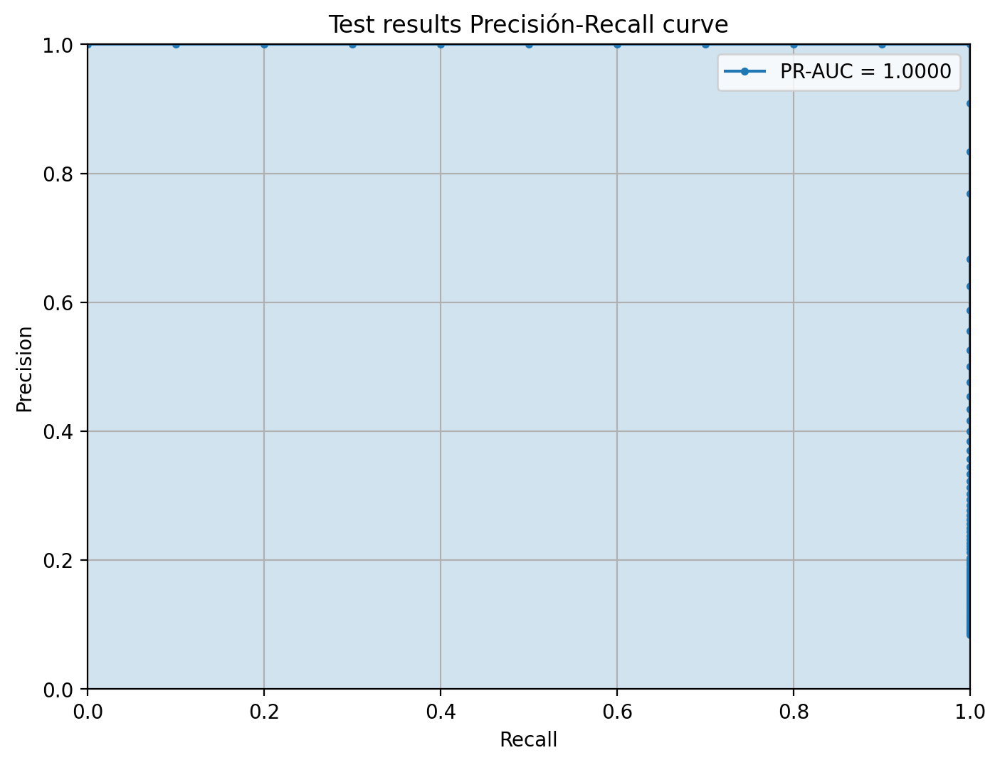

Test PR-AUC: 0.9999999999999999
Test MCC (0.5 threshold): 1.0


In [76]:
predictions = np.zeros(len(x_test))
for model in models_dict:
    predictions += weights_dict[model] * predictions_dict[model][:,1]

#print(predictions)
precision, recall, thres = precision_recall_curve(y_test, predictions)
pr_auc = auc(recall, precision)  # Área bajo la curva PR

print("Test results:")

plt.figure(figsize=(8,6))
plt.plot(recall, precision, marker='.', label=f'PR-AUC = {pr_auc:.4f}')
plt.fill_between(recall,precision,alpha =0.2)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.xlim([0,1])
plt.ylim([0,1])
plt.title('Test results Precisión-Recall curve')
plt.legend()
plt.grid()
plt.show()

predictions[predictions >= 0.5] = 1
predictions[predictions < 0.5] = 0

print(f"Test PR-AUC: {auc(recall, precision)}")
print(f"Test MCC (0.5 threshold): {matthews_corrcoef(y_test, predictions)}")

In this case the prediction was perfect. Nonetheless, we will repeat this process using different seeds for partitions to test its robustness

### Repeat for multiple seeds

In [77]:
NUM_SEEDS = 20

mccs = {model: [] for model in models_dict}
pr_aucs = {model: [] for model in models_dict}
mccs['EnsembleModel'] = []
pr_aucs['EnsembleModel'] = []
precisions = []
recalls = []

for seed in range(SEED, SEED + NUM_SEEDS):
    # Data partition
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.1, stratify=y, random_state=seed) 

    # Models definition
    results_cv_dict = {model: [] for model in models_dict}  

    # Models training
    for model in models_dict:                       
        clf = models_dict[model]
        cv = StratifiedKFold(n_splits=10)
        scores = cross_val_score(clf, x_train, y_train, cv=cv, scoring=mcc_scorer)
        results_cv_dict[model] = np.mean(scores)

    # Obtention of test results using those models
    predictions_dict = {}
    for model in models_dict:
        clf = models_dict[model]
        clf.fit(x_train, y_train)
        predprobs = clf.predict_proba(x_test)[:,1]
        predictions_dict[model] = predprobs
        mccs[model].append(matthews_corrcoef(y_test, clf.predict(x_test)))
        precision, recall, _ = precision_recall_curve(y_test, predprobs)
        pr_aucs[model].append(auc(recall, precision))

    print(mccs)


    # Weights for ensemble model
    w_min = min(results_cv_dict.values())
    w_max = max(results_cv_dict.values())
    new_w = {model: (score - w_min) / (w_max - w_min) for model,score in results_cv_dict.items()}
    suma = sum(new_w.values())
    weights_dict = {model: score / suma for model,score in new_w.items()}
    
    # Make final predictions
    predictions = np.zeros(len(x_test))
    for model in models_dict:
        predictions += weights_dict[model] * predictions_dict[model]

    #Calculate PR-AUC
    precision, recall, _ = precision_recall_curve(y_test, predictions)
    precisions.append(precision)
    recalls.append(recall)
    pr_aucs['EnsembleModel'].append(auc(recall, precision))

    predictions[predictions >= 0.5] = 1
    predictions[predictions < 0.5] = 0

    # Calculate Matthews-corrcoef
    mccs['EnsembleModel'].append((matthews_corrcoef(y_test, predictions)))


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 78, number of negative: 876
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000538 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1128
[LightGBM] [Info] Number of data points in the train set: 954, number of used features: 68
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081761 -> initscore=-2.418657
[LightGBM] [Info] Start training from score -2.418657
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

Final test results for Legendary classification using different partition seeds:
--- LightGBM ---
- MCC
Mean value: 0.9455796933449276
Std: 0.05714076625190908
Values: [0.9443215126566032, 0.8907407407407407, 0.9443215126566032, 0.9490381450044043, 1.0, 1.0, 0.9443215126566032, 0.9490381450044043, 0.9443215126566032, 1.0, 1.0, 0.9490381450044043, 1.0, 0.8443778635927036, 0.9490381450044043, 0.9443215126566032, 0.7606388292556648, 0.9490381450044043, 1.0, 0.9490381450044043]
--- PR-AUC ---
Mean value: 0.9830887445887445
Std: 0.053986574907206215
Values: [0.9999999999999999, 0.9904545454545454, 0.9904545454545454, 0.9680934343434343, 0.9999999999999999, 0.9999999999999999, 0.9999999999999999, 0.9999999999999999, 0.9999999999999999, 0.9999999999999999, 0.9999999999999999, 0.9999999999999999, 0.9999999999999999, 0.9602146464646465, 0.9999999999999999, 0.9999999999999999, 0.9999999999999999, 0.9999999999999999, 0.9999999999999999, 0.75255772005772]
--- DecisionTreeClassifier ---
- MCC
Mean 

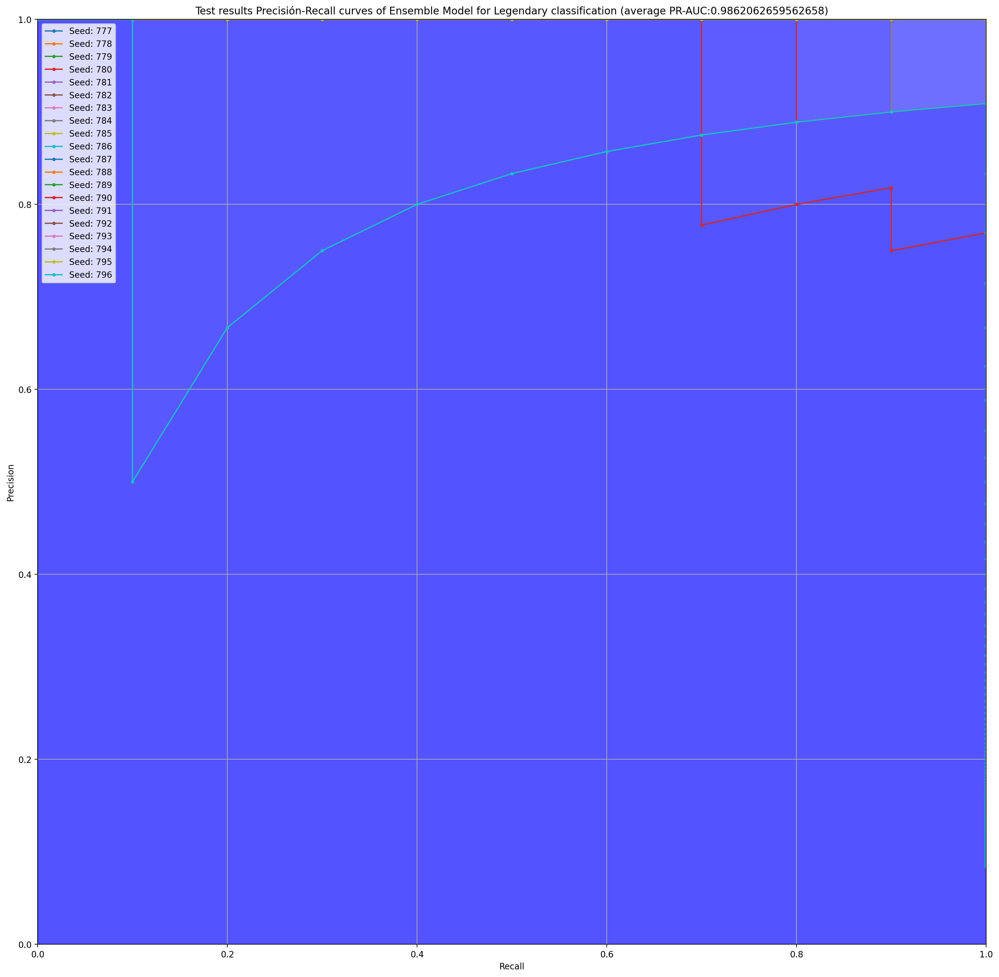

In [78]:
print("Final test results for Legendary classification using different partition seeds:")
for elem in mccs:
    print(f"--- {elem} ---")
    print("- MCC")
    print(f"Mean value: {np.array(mccs[elem]).mean()}")
    print(f"Std: {np.array(mccs[elem]).std()}")
    print(f"Values: {mccs[elem]}")
    print("--- PR-AUC ---")
    print(f"Mean value: {np.array(pr_aucs[elem]).mean()}")
    print(f"Std: {np.array(pr_aucs[elem]).std()}")
    print(f"Values: {pr_aucs[elem]}")

fig, ax = plt.subplots()
for i in range(NUM_SEEDS):
    plt.plot(recalls[i], precisions[i], marker='.', label=f'Seed: {SEED + i}')
    plt.fill_between(recalls[i], precisions[i], alpha=float(1.0/NUM_SEEDS), color='blue')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.xlim([0,1])
plt.ylim([0,1])
plt.title(f'Test results Precisión-Recall curves of Ensemble Model for Legendary classification (average PR-AUC:{np.array(pr_aucs["EnsembleModel"]).mean()})')
plt.legend()
plt.grid()
plt.show()
fig.savefig('../Images/Graphics/PRAUCLegendary.png', bbox_inches='tight')

/var/folders/js/tzntqtz92vx_98g_mzk004fw0000gn/T/ipykernel_16168/2448772714.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_results, x="Model", y="RMSEMean", palette=colors)


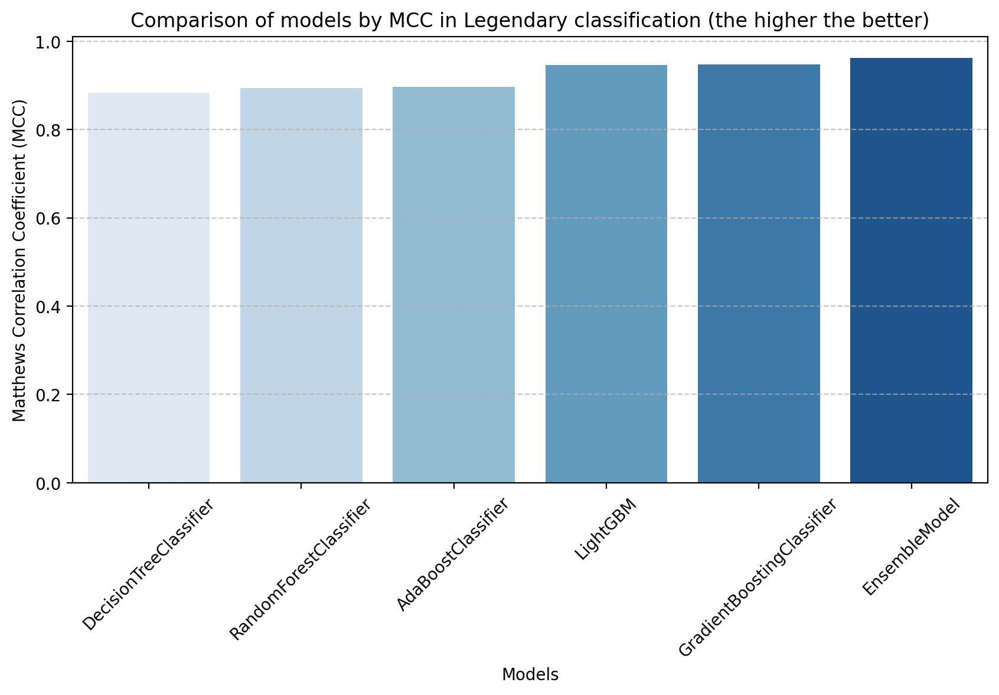

In [79]:
df_results = pd.DataFrame({
    "Model": list(mccs.keys()),
    "RMSEMean": [np.mean(scores) for scores in mccs.values()]
}).sort_values(by="RMSEMean", ascending=True)

num_models = len(df_results)
colors = sns.color_palette("Blues", num_models)

plt.figure(figsize=(10, 5))
sns.barplot(data=df_results, x="Model", y="RMSEMean", palette=colors)

plt.xlabel("Models")
plt.ylabel("Matthews Correlation Coefficient (MCC)")
plt.title("Comparison of models by MCC in Legendary classification (the higher the better)")
plt.xticks(rotation=45)
plt.grid(axis="y", linestyle="--", alpha=0.7)

plt.show()

So we can conclude that being legendary can be predicted very precisely. Let us try to predict the other 2 attributes using the same technique, as they are even more unbalanced:

In [80]:
x = data.copy()
x = x.drop(['DexNumber', 'Category', 'Ability1', 'Ability2', 'HiddenAbility', 'Generation', 'IsLegendary', 'IsMythical', 'IsUltraBeast', 'PreevoName'], axis=1)
y = data['IsMythical']
print(f"No Mythical: {(y == 0).sum()}, ({(100*(y == 0).sum() / y.shape)[0]}%)")
print(f"Mythical: {(y == 1).sum()}, ({(100*(y == 1).sum() / y.shape)[0]}%)")

mccs = {model: [] for model in models_dict}
pr_aucs = {model: [] for model in models_dict}
mccs['EnsembleModel'] = []
pr_aucs['EnsembleModel'] = []
precisions = []
recalls = []

for seed in range(SEED, SEED + NUM_SEEDS):
    # Data partition
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.1, stratify=y, random_state=seed) 

    # Models definition
    results_cv_dict = {model: [] for model in models_dict}  

    # Models training
    for model in models_dict:                       
        clf = models_dict[model]
        cv = StratifiedKFold(n_splits=10)
        scores = cross_val_score(clf, x_train, y_train, cv=cv, scoring=mcc_scorer)
        results_cv_dict[model] = np.mean(scores)

    # Obtention of test results using those models
    predictions_dict = {}
    for model in models_dict:
        clf = models_dict[model]
        clf.fit(x_train, y_train)
        predprobs = clf.predict_proba(x_test)[:,1]
        predictions_dict[model] = predprobs
        mccs[model].append(matthews_corrcoef(y_test, clf.predict(x_test)))
        precision, recall, _ = precision_recall_curve(y_test, predprobs)
        pr_aucs[model].append(auc(recall, precision))

    print(mccs)


    # Weights for ensemble model
    w_min = min(results_cv_dict.values())
    w_max = max(results_cv_dict.values())
    new_w = {model: (score - w_min) / (w_max - w_min) for model,score in results_cv_dict.items()}
    suma = sum(new_w.values())
    weights_dict = {model: score / suma for model,score in new_w.items()}
    
    # Make final predictions
    predictions = np.zeros(len(x_test))
    for model in models_dict:
        predictions += weights_dict[model] * predictions_dict[model]

    #Calculate PR-AUC
    precision, recall, _ = precision_recall_curve(y_test, predictions)
    precisions.append(precision)
    recalls.append(recall)
    pr_aucs['EnsembleModel'].append(auc(recall, precision))

    predictions[predictions >= 0.5] = 1
    predictions[predictions < 0.5] = 0

    # Calculate Matthews-corrcoef
    mccs['EnsembleModel'].append((matthews_corrcoef(y_test, predictions)))

No Mythical: 1145, (97.11620016963528%)
Mythical: 34, (2.883799830364716%)
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 27, number of negative: 927
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000609 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1118
[LightGBM] [Info] Number of data points in the train set: 954, number of used features: 68
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.028302 -> initscore=-3.536117
[LightGBM] [Info] Start training from score -3.536117
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

Final test results for Mythical classification using different partition seeds:
--- LightGBM ---
- MCC
Mean value: 0.8860507910143369
Std: 0.13891181966604865
Values: [1.0, 0.6579710144927536, 0.6579710144927536, 1.0, 1.0, 0.8129695813681377, 1.0, 1.0, 1.0, 0.8129695813681377, 0.8129695813681377, 1.0, 0.8129695813681377, 1.0, 1.0, 1.0, 0.5723943812052383, 1.0, 0.8129695813681377, 0.7678315032553069]
--- PR-AUC ---
Mean value: 0.9505828825783187
Std: 0.09500195444990349
Values: [1.0, 0.6948275862068964, 0.7140522875816993, 1.0, 1.0, 0.9027777777777777, 1.0, 1.0, 1.0, 0.8500000000000001, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.8500000000000001, 1.0, 1.0, 1.0]
--- DecisionTreeClassifier ---
- MCC
Mean value: 0.7696134496647729
Std: 0.1739351755866637
Values: [0.8622518546628736, 0.6579710144927536, 0.5647497527616482, 0.8622518546628736, 0.8622518546628736, 0.3958808396227453, 0.8622518546628736, 0.7678315032553069, 1.0, 0.8129695813681377, 0.8129695813681377, 0.5647497527616482, 1.0, 0.767831503

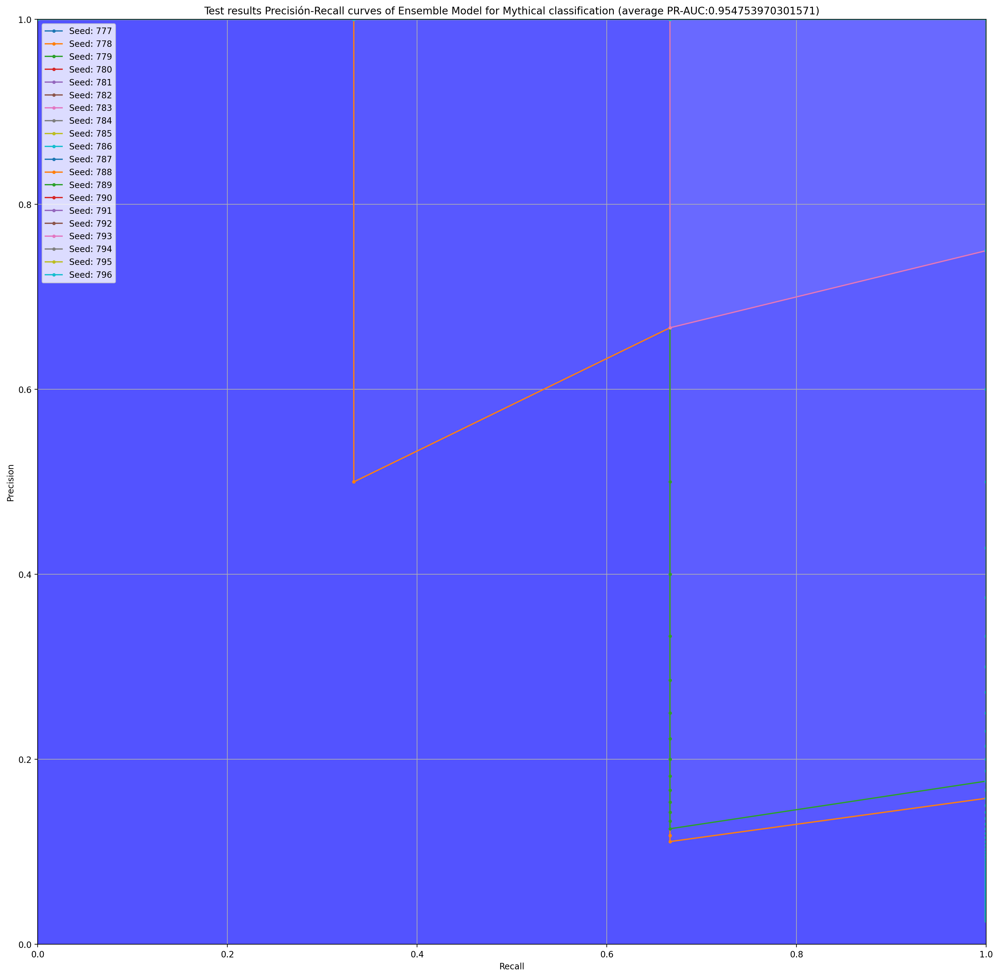

In [81]:
print("Final test results for Mythical classification using different partition seeds:")
for elem in mccs:
    print(f"--- {elem} ---")
    print("- MCC")
    print(f"Mean value: {np.array(mccs[elem]).mean()}")
    print(f"Std: {np.array(mccs[elem]).std()}")
    print(f"Values: {mccs[elem]}")
    print("--- PR-AUC ---")
    print(f"Mean value: {np.array(pr_aucs[elem]).mean()}")
    print(f"Std: {np.array(pr_aucs[elem]).std()}")
    print(f"Values: {pr_aucs[elem]}")

fig, ax = plt.subplots()

for i in range(NUM_SEEDS):
    plt.plot(recalls[i], precisions[i], marker='.', label=f'Seed: {SEED + i}')
    plt.fill_between(recalls[i], precisions[i], alpha=float(1.0/NUM_SEEDS), color='blue')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.xlim([0,1])
plt.ylim([0,1])
plt.title(f'Test results Precisión-Recall curves of Ensemble Model for Mythical classification (average PR-AUC:{np.array(pr_aucs["EnsembleModel"]).mean()})')
plt.legend()
plt.grid()
plt.show()
fig.savefig('../Images/Graphics/PRAUCMythical.png', bbox_inches='tight')

In [82]:
x = data.copy()
x = x.drop(['DexNumber', 'Category', 'Ability1', 'Ability2', 'HiddenAbility', 'Generation', 'IsLegendary', 'IsMythical', 'IsUltraBeast', 'PreevoName'], axis=1)
y = data['IsUltraBeast']
print(f"No Ultra Beast: {(y == 0).sum()}, ({(100*(y == 0).sum() / y.shape)[0]}%)")
print(f"Ultra Beast: {(y == 1).sum()}, ({(100*(y == 1).sum() / y.shape)[0]}%)")

mccs = {model: [] for model in models_dict}
pr_aucs = {model: [] for model in models_dict}
mccs['EnsembleModel'] = []
pr_aucs['EnsembleModel'] = []
precisions = []
recalls = []

for seed in range(SEED, SEED + NUM_SEEDS):
    # Data partition
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.1, stratify=y, random_state=seed) 

    # Models definition
    results_cv_dict = {model: [] for model in models_dict}  

    # Models training
    for model in models_dict:                       
        clf = models_dict[model]
        cv = StratifiedKFold(n_splits=10)
        scores = cross_val_score(clf, x_train, y_train, cv=cv, scoring=mcc_scorer)
        results_cv_dict[model] = np.mean(scores)

    # Obtention of test results using those models
    predictions_dict = {}
    for model in models_dict:
        clf = models_dict[model]
        clf.fit(x_train, y_train)
        predprobs = clf.predict_proba(x_test)[:,1]
        predictions_dict[model] = predprobs
        mccs[model].append(matthews_corrcoef(y_test, clf.predict(x_test)))
        precision, recall, _ = precision_recall_curve(y_test, predprobs)
        pr_aucs[model].append(auc(recall, precision))

    print(mccs)


    # Weights for ensemble model
    w_min = min(results_cv_dict.values())
    w_max = max(results_cv_dict.values())
    new_w = {model: (score - w_min) / (w_max - w_min) for model,score in results_cv_dict.items()}
    suma = sum(new_w.values())
    weights_dict = {model: score / suma for model,score in new_w.items()}
    
    # Make final predictions
    predictions = np.zeros(len(x_test))
    for model in models_dict:
        predictions += weights_dict[model] * predictions_dict[model]

    #Calculate PR-AUC
    precision, recall, _ = precision_recall_curve(y_test, predictions)
    precisions.append(precision)
    recalls.append(recall)
    pr_aucs['EnsembleModel'].append(auc(recall, precision))

    predictions[predictions >= 0.5] = 1
    predictions[predictions < 0.5] = 0

    # Calculate Matthews-corrcoef
    mccs['EnsembleModel'].append((matthews_corrcoef(y_test, predictions)))

No Ultra Beast: 1168, (99.06700593723494%)
Ultra Beast: 11, (0.9329940627650551%)
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 9, number of negative: 945
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000467 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1135
[LightGBM] [Info] Number of data points in the train set: 954, number of used features: 68
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009434 -> initscore=-4.653960
[LightGBM] [Info] Start training from score -4.653960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

Final test results for UltraBeast classification using different partition seeds:
--- LightGBM ---
- MCC
Mean value: 1.0
Std: 0.0
Values: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
--- PR-AUC ---
Mean value: 1.0
Std: 0.0
Values: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
--- DecisionTreeClassifier ---
- MCC
Mean value: 0.569008063173896
Std: 0.4379047181041925
Values: [0.0, 0.7040784727049221, 0.7040784727049221, 0.0, 0.0, 1.0, 1.0, 1.0, 0.7040784727049221, -0.008547008547008548, 0.0, 1.0, 0.7040784727049221, 1.0, 0.0, 1.0, 1.0, 1.0, 0.5723943812052383, 0.0]
--- PR-AUC ---
Mean value: 0.734816384180791
Std: 0.26654188097957293
Values: [0.5042372881355932, 0.75, 0.75, 0.5042372881355932, 0.5042372881355932, 1.0, 1.0, 1.0, 0.75, 0.00423728813559322, 0.5042372881355932, 1.0, 0.75, 1.0, 0.5042372881355932, 1.0, 1.0, 1.0, 0.6666666666666666, 0.5042372881355932]
--- RandomFores

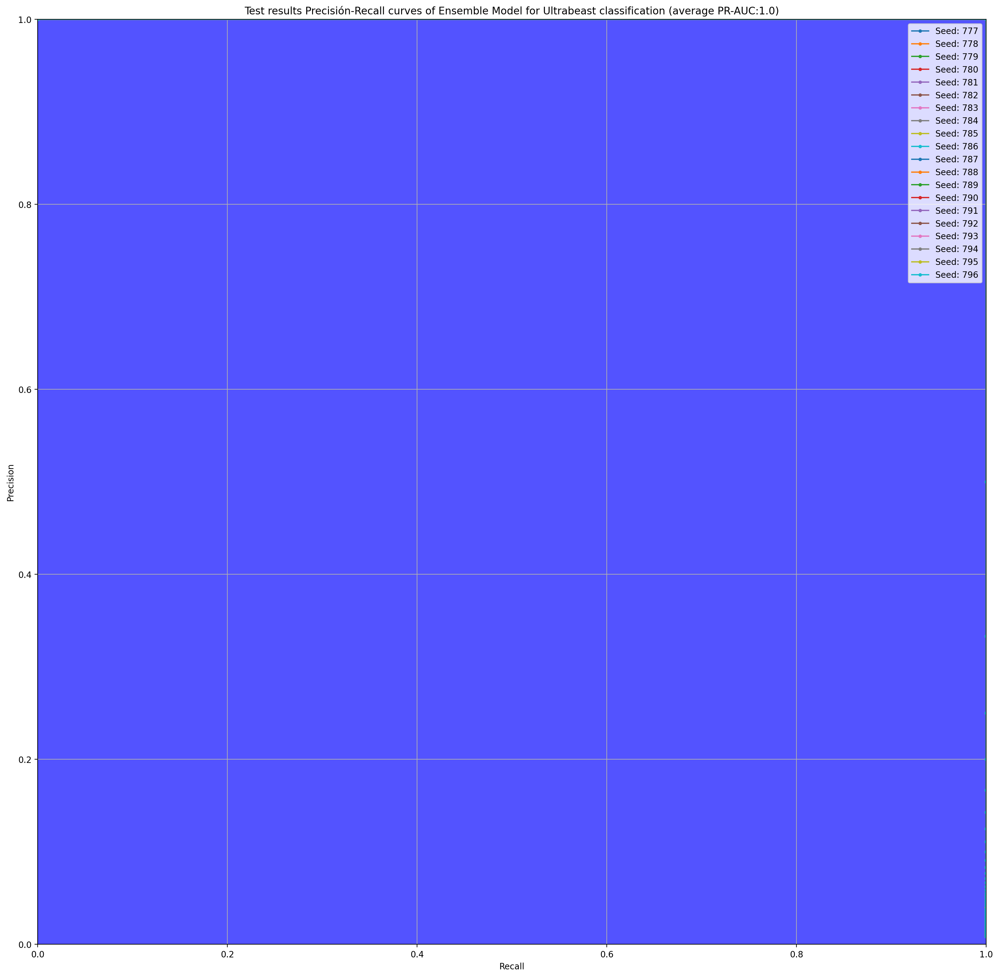

In [83]:
print("Final test results for UltraBeast classification using different partition seeds:")
for elem in mccs:
    print(f"--- {elem} ---")
    print("- MCC")
    print(f"Mean value: {np.array(mccs[elem]).mean()}")
    print(f"Std: {np.array(mccs[elem]).std()}")
    print(f"Values: {mccs[elem]}")
    print("--- PR-AUC ---")
    print(f"Mean value: {np.array(pr_aucs[elem]).mean()}")
    print(f"Std: {np.array(pr_aucs[elem]).std()}")
    print(f"Values: {pr_aucs[elem]}")

fig, ax = plt.subplots()

for i in range(NUM_SEEDS):
    plt.plot(recalls[i], precisions[i], marker='.', label=f'Seed: {SEED + i}')
    plt.fill_between(recalls[i], precisions[i], alpha=float(1.0/NUM_SEEDS), color='blue')
    
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.xlim([0,1])
plt.ylim([0,1])
plt.title(f'Test results Precisión-Recall curves of Ensemble Model for Ultrabeast classification (average PR-AUC:{np.array(pr_aucs["EnsembleModel"]).mean()})')
plt.legend()
plt.grid()
fig.savefig('../Images/Graphics/PRAUCUltraBeast.png', bbox_inches='tight')

# Predict LevelingRate as regression

Additionally I will consider a regression problem, being predicting LevelingRate (as amount of Exp at level 100) based on the rest of the (numerical) features. There are indeed 6 ordinal categories, so it could be also considered as an ordinal classification problem, but it will be done in a further iteration of the project.

I will first select the data to work with

In [ ]:
x = data.copy()
x = x.drop(['DexNumber', 'Category', 'Ability1', 'Ability2', 'HiddenAbility', 'Generation', 'LevelingRate', 'PreevoName'], axis=1)
y = data['LevelingRate']
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.1, stratify=y, random_state=SEED)

In [ ]:
data['LevelingRate']

Name
Victini                    1250000
Bulbasaur                  1059860
Ivysaur                    1059860
Venusaur                   1059860
Charmander                 1059860
                            ...   
Iron Boulder               1250000
Iron Crown                 1250000
Terapagos Normal Form      1250000
Terapagos Terastal Form    1250000
Pecharunt                  1250000
Name: LevelingRate, Length: 1179, dtype: int64

The first thing that we will do is rescale the labels to the range [0,1], so that the RMSE can be better interpreted. We will also normalize the rest of the features.

In [22]:
scaler =  MinMaxScaler(feature_range=(0, 1))
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)
y_train = pd.Series(scaler.fit_transform(y_train.values.reshape(-1, 1)).flatten(), index=y_train.index)
y_test = pd.Series(scaler.transform(y_test.values.reshape(-1, 1)).flatten(), index=y_test.index)

We will consider the different models below. The cross validation results are also printed

In [23]:
models_dict = {
    'LinearRegression': LinearRegression(),
    'DecisionTreeRegressor': DecisionTreeRegressor(),
    'RandomForestRegressor': RandomForestRegressor(),
    'GradientBoostingRegressor': GradientBoostingRegressor(),
    'AdaBoostRegressor': AdaBoostRegressor()
}

rmse_scorer = make_scorer(root_mean_squared_error)

results_cv_dict_reg = {model: [] for model in models_dict}

rmse_scores = {}
for name, model in models_dict.items():
    print(name)
    reg = models_dict[name]
    cv = KFold(n_splits=10)
    scores = cross_val_score(reg, x_train, y_train, cv=cv, scoring=rmse_scorer)
    print('- Cross Validation Scores: ', scores)
    print('- Mean Cross Validation Score: ', np.mean(scores))
    results_cv_dict_reg[name] = np.mean(scores)
    print('- Standard Deviation of Cross Validation Scores: ', np.std(scores))

LinearRegression
- Cross Validation Scores:  [0.15197068 0.13751966 0.1076554  0.12960604 0.11996602 0.12587303
 0.15377095 0.1408663  0.09887162 0.14625419]
- Mean Cross Validation Score:  0.1312353894784028
- Standard Deviation of Cross Validation Scores:  0.017485572576667864
DecisionTreeRegressor
- Cross Validation Scores:  [0.15541079 0.17439362 0.16917054 0.15844783 0.14969204 0.15067392
 0.15929118 0.1462651  0.14649127 0.16726945]
- Mean Cross Validation Score:  0.15771057462414556
- Standard Deviation of Cross Validation Scores:  0.009381049333890184
RandomForestRegressor
- Cross Validation Scores:  [0.13571029 0.12457727 0.09586401 0.11019915 0.10370167 0.11511169
 0.13894098 0.12061289 0.07604165 0.12477673]
- Mean Cross Validation Score:  0.11455363305771864
- Standard Deviation of Cross Validation Scores:  0.018037624931078397
GradientBoostingRegressor
- Cross Validation Scores:  [0.14124805 0.13802518 0.09875284 0.11862786 0.11402039 0.11750851
 0.14893106 0.1320956  0.08

So the ranking using validation data is:

In [24]:
print('Ranking of models:')
metric = 'RMSE'
i = 1
for key, elem in dict(sorted(results_cv_dict_reg.items(), key=lambda item: item[1], reverse=False)).items():
    print(f"{i}: {key} ({elem} {metric})")
    i = i + 1

Ranking of models:
1: RandomForestRegressor (0.11455363305771864 RMSE)
2: GradientBoostingRegressor (0.12255970697149154 RMSE)
3: LinearRegression (0.1312353894784028 RMSE)
4: AdaBoostRegressor (0.15717186462086646 RMSE)
5: DecisionTreeRegressor (0.15771057462414556 RMSE)


In this case, the lower RMSE the better, so it will be taken into account for weighting the ensemble model:

In [25]:
NUM_SEEDS = 20

rmses = {model: [] for model in models_dict}
rmses['EnsembleModel'] = []

for seed in range(SEED, SEED + NUM_SEEDS):
    # Data partition
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.1, stratify=y, random_state=seed)

    scaler =  MinMaxScaler(feature_range=(0, 1))
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)
    y_train = pd.Series(scaler.fit_transform(y_train.values.reshape(-1, 1)).flatten(), index=y_train.index)
    y_test = pd.Series(scaler.transform(y_test.values.reshape(-1, 1)).flatten(), index=y_test.index)

    scaler =  MinMaxScaler(feature_range=(0, 1))
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)
    y_train = pd.Series(scaler.fit_transform(y_train.values.reshape(-1, 1)).flatten(), index=y_train.index)
    y_test = pd.Series(scaler.transform(y_test.values.reshape(-1, 1)).flatten(), index=y_test.index)

    # Models definition
    results_cv_dict = {model: [] for model in models_dict}  

    # Models training
    for model in models_dict:                       
        reg = models_dict[name]
        cv = KFold(n_splits=10)
        scores = cross_val_score(reg, x_train, y_train, cv=cv, scoring=rmse_scorer)
        results_cv_dict[model] = np.mean(scores)

    # Obtention of test results using those models
    predictions_dict = {}
    for model in models_dict:
        reg = models_dict[model]
        reg.fit(x_train, y_train)
        preds = reg.predict(x_test)
        predictions_dict[model] = preds
        rmses[model].append(root_mean_squared_error(y_test, preds))

    # Weights for ensemble model
    w_min = min(results_cv_dict.values())
    w_max = max(results_cv_dict.values())
    new_w = {model: 1-(score - w_min) / (w_max - w_min) for model,score in results_cv_dict.items()}
    suma = sum(new_w.values())
    weights_dict = {model: score / suma for model,score in new_w.items()}
    
    # Make final predictions
    predictions = np.zeros(len(x_test))
    for model in models_dict:
        predictions += weights_dict[model] * predictions_dict[model][:]

    # Calculate Matthews-corrcoef
    rmses['EnsembleModel'].append((root_mean_squared_error(y_test, predictions)))

So the final results are:

In [26]:
print("Final test results for LevelingRate regression using different partition seeds:")
for model in rmses:
    print(f"--- {model} ---")
    print(f"Mean RMSE value: {np.array(rmses[model]).mean()}")
    print(f"RMSE Std: {np.array(rmses[model]).std()}")
    print(f"RMSE Values: {rmses[model]}")

Final test results for LevelingRate regression using different partition seeds:
--- LinearRegression ---
Mean RMSE value: 0.12295402089274148
RMSE Std: 0.003490801464752516
RMSE Values: [0.12093362169843082, 0.12936925959662404, 0.1301023584966911, 0.1209239047289929, 0.12377950031654258, 0.12131694934320707, 0.1207456269209302, 0.11951069019215672, 0.12282232686993552, 0.12067888344859569, 0.1267864370635475, 0.12608452996061248, 0.12117557820786978, 0.12363006126364083, 0.11758132113634168, 0.1160549048142192, 0.12446827416356909, 0.12260940752773361, 0.12480010939234586, 0.12570667271284325]
--- DecisionTreeRegressor ---
Mean RMSE value: 0.1549176222436777
RMSE Std: 0.019052282291168614
RMSE Values: [0.12375632039041914, 0.15507909111903737, 0.1748683602787023, 0.12923214713025352, 0.16426743662968316, 0.19344473083162772, 0.17268145768517534, 0.17849352273916982, 0.15158541530052394, 0.16603328448164154, 0.1564598684239476, 0.13177749410440714, 0.18052679234427207, 0.14503179325084

# Non-supervised learning: Clustering

We are going to do hierarchical clustering to see how can Pokémon be grouped and which Pokémon are more similar among them:

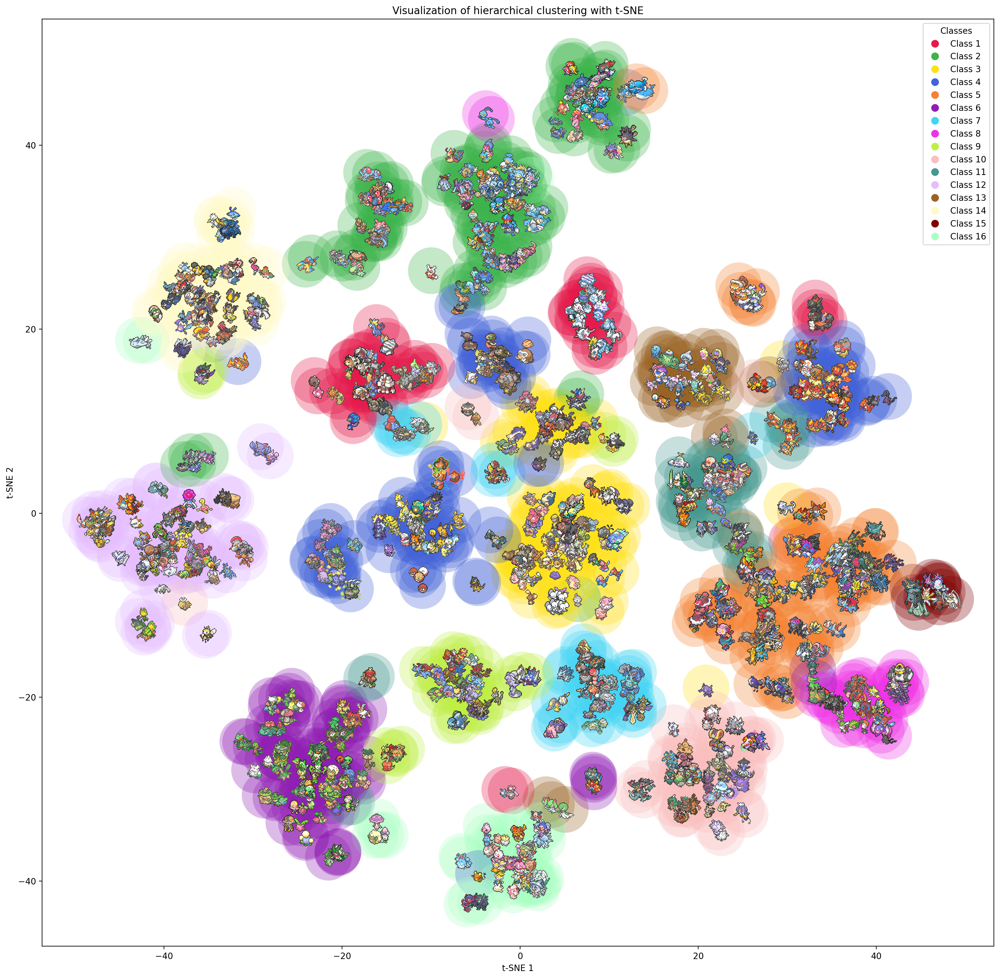

In [27]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import AgglomerativeClustering
from sklearn.manifold import TSNE
from sklearn.datasets import make_blobs
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

ICONSPATH = '../Images/Icons'

def getImage(path, zoom=0.4):
    return OffsetImage(plt.imread(path), zoom=zoom)



# STEP 1: Select the data to work with
x = data.drop(['DexNumber', 'Category', 'Ability1', 'Ability2', 'HiddenAbility', 'Generation', 'PreevoName'], axis=1)

scaler = StandardScaler()
x = scaler.fit_transform(x)

# STEP 2: Perform the hierarchical clustering
agg_clustering = AgglomerativeClustering(n_clusters=16)
labels = agg_clustering.fit_predict(x)


# STEP 3: Reduce dimensionality with t-SNE
tsne = TSNE(n_components=2, random_state=SEED)
X_tsne = tsne.fit_transform(x)


# STEP 4: Visualizar los resultados de t-SNE y los clusters

# Random perturbation for better visualization purposes
alpha = 1
perturbation = np.random.normal(loc=0, scale=alpha / 2, size=(X_tsne.shape[0], 2))
perturbation = np.clip(perturbation, -alpha, alpha)
X_tsne[:, :2] += perturbation


plt.rcParams['figure.figsize'] = [20, 20]
plt.rcParams['figure.dpi'] = 200


color_map = {0: "#e6194B", 1: "#3cb44b", 2: "#ffe119", 3: "#4363d8",
    4: "#f58231", 5: "#911eb4", 6: "#42d4f4", 7: "#f032e6",
    8: "#bfef45", 9: "#fabebe", 10: "#469990", 11: "#e6beff",
    12: "#9A6324", 13: "#fffac8", 14: "#800000", 15: "#aaffc3"}

colors = [color_map[label] for label in labels]


legend_labels = {0: "Class 1", 1: "Class 2", 2: "Class 3", 3: "Class 4",
    4: "Class 5", 5: "Class 6", 6: "Class 7", 7: "Class 8",
    8: "Class 9", 9: "Class 10", 10: "Class 11", 11: "Class 12",
    12: "Class 13", 13: "Class 14", 14: "Class 15", 15: "Class 16"}

handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_map[i], markersize=10) for i in legend_labels]

fig, ax = plt.subplots()

ax.scatter(X_tsne[:, 0], X_tsne[:, 1], c=colors, label=labels, s=3000, alpha=0.3, linewidths=0)
for i in range(data.shape[0]):
    ab = AnnotationBbox(getImage(transformpath(ICONSPATH, f'{data.index[i]}.png')), (X_tsne[i, 0], X_tsne[i, 1]), frameon=False)
    ax.add_artist(ab)
ax.legend(handles, legend_labels.values(), title="Classes")

plt.title("Visualization of hierarchical clustering with t-SNE")
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.show()
fig.savefig('../Images/Graphics/Clustering.png', bbox_inches='tight')

The interpretation of these classes will be done in the readme.

# Computer Vision: Predicting types using minisprites

Another interesting field inside AI/Data Science is Computer Vision. As a possible application of computer vision to this project, we can clearly use it to predict Pokémon typing only seeing its image. As in the previous part of the project I was working with minisprites for visualization, I will use them.

So the obective is to predict a Pokémon's main (first) typing based on its minisprite.

### Read Images

We first read all images from the icons folder

In [397]:
"""
import subprocess

allicons = os.listdir(PATH_IMGS)
for file in allicons:
    os.rename(f'{PATH_IMGS}/{file}', f'{PATH_IMGS}/{file.title()[:-4]}.png')

subprocess.run(["mdimport", PATH_IMGS])
"""

'\nimport subprocess\n\nallicons = os.listdir(PATH_IMGS)\nfor file in allicons:\n    os.rename(f\'{PATH_IMGS}/{file}\', f\'{PATH_IMGS}/{file.title()[:-4]}.png\')\n\nsubprocess.run(["mdimport", PATH_IMGS])\n'

In [398]:
imgs = []
imgs_cv2 = []
img_names = []

for name in listdir(PATH_IMGS):
    if isfile(join(PATH_IMGS, name)) and f"{PATH_IMGS}/{name}"[-4:] == '.png':
        imgs.append(img_to_array(load_img(transformpath(PATH_IMGS, f"{name}"), color_mode='rgba', target_size = (224, 224), interpolation="bilinear"))[:, :, :3])
        imgs_cv2.append(cv2.imread(transformpath(PATH_IMGS, f"{name}"), cv2.IMREAD_UNCHANGED))

        if transformpath(PATH_IMGS, f"{name}").split('/')[-1][:-4] == 'Type Null':
            img_names.append('Type: Null')
        elif transformpath(PATH_IMGS, f"{name}").split('/')[-1][:-4] == 'Silvally':
            img_names.append('Silvally Type: Normal')
        else:
            img_names.append(transformpath(PATH_IMGS, f"{name}").split('/')[-1][:-4])

print(img_names)
print(len(imgs), "images have been read.")
for elem in imgs:
    assert elem.shape == (224,224,3)

['Vivillon_19', 'Parasect', 'Sobble', 'Lumineon', 'Raikou', 'Runerigus', 'Dedenne', 'Pyroar', 'Pawmi', 'Girafarig_Female', 'Articuno', 'Maushold Family Of Four', 'Magmortar', 'Hisuian Decidueye', 'Ogerpon_8', 'Bulbasaur', 'Mimikyu Disguised Form', 'Banette', 'Staraptor', 'Pidove', 'Morgrem', 'Donphan_Female', 'Comfey', 'Taillow', 'Charizard', 'Pumpkaboo_3', 'Infernape', 'Minior Red Core', 'Sandshrew', 'Marshadow', 'Alakazam', 'Lickitung', 'Alcremie_5', 'Starmie', 'Alcremie_49', 'Deoxys Normal Forme', 'Alcremie_61', 'Yanmega', 'Yveltal', 'Zigzagoon', 'Petilil', 'Torterra', 'Purugly', 'Pikachu_9', 'Tandemaus', 'Cresselia', 'Regigigas', 'Gible_Female', 'Hisuian Lilligant', 'Palkia', 'Thundurus Incarnate Forme', 'Impidimp', 'Froakie', 'Kilowattrel', 'Arrokuda', 'Munna', 'Bellossom', 'Gabite', 'Pikachu_8', 'Snover_Female', 'Gyarados_1', 'Mareep', 'Shieldon', 'Alcremie_60', 'Sneasler', 'Alcremie_48', 'Alcremie_4', 'Stoutland', 'Corviknight', 'Squawkabilly White Plumage', 'Pidgeot_1', 'Pumpka

After that we need to only consider images of Pokémon belonging to the dataset, thus they have to be filtered

In [399]:
imgs = [imgs[i] for i in range(len(imgs)) if img_names[i] in list(data.index)]
imgs_cv2 = [imgs_cv2[i] for i in range(len(imgs_cv2)) if img_names[i] in list(data.index)]
img_names = [img_names[i] for i in range(len(img_names)) if img_names[i] in list(data.index)]

for elem in list(data.index):
    if not elem in img_names:
        print(elem)

print(len(imgs), "images have been read.")

1179 images have been read.


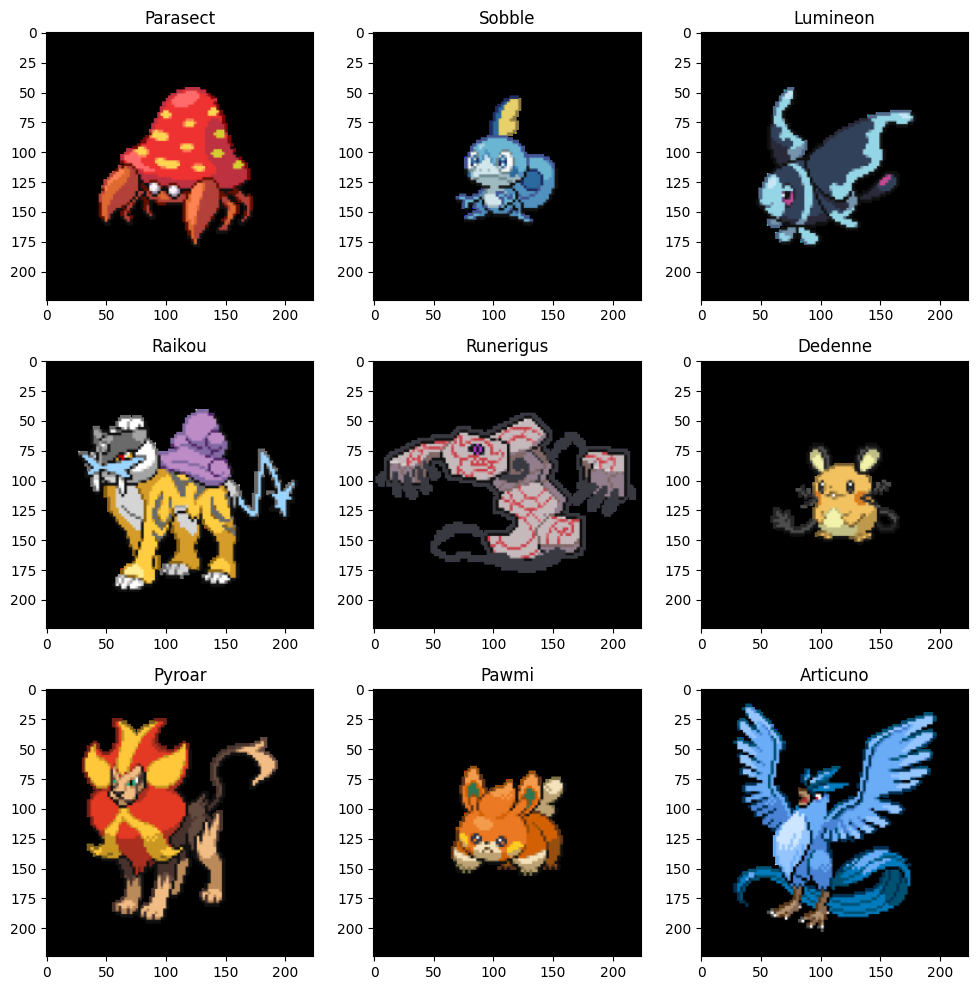

In [400]:
num = 3
plt.rcParams['figure.figsize'] = [10, 10]
plt.rcParams['figure.dpi'] = 100
fig, axs = plt.subplots(num, num)
for i in range(0,num**2):
    image = imgs[i].astype(np.uint8)
    axs[int(i/num), i%num].imshow(image)
    axs[int(i/num), i%num].set_title(img_names[i])
fig.tight_layout()
plt.show()
fig.savefig('../Images/Graphics/CVIcons.png', bbox_inches='tight')

### Data Labeling, Partitioning and additional considerations

I am going to consider the label of each Pokémon to be a 18 positions array, whose values at each position can be:
- 0 if the main type is not that type
- 1 if the main type is that type

So each array will have exactly one 1 and the rest of positions will be zero, treating this as a multiclass classification problem

In [401]:
"""
typefeatures = ['Type_Bug', 'Type_Dark', 'Type_Dragon', 'Type_Electric', 'Type_Fairy', 'Type_Fighting', 'Type_Fire', 'Type_Flying', 'Type_Ghost', 'Type_Grass', 'Type_Ground', 'Type_Ice', 'Type_Normal', 'Type_Poison', 'Type_Psychic', 'Type_Rock', 'Type_Steel', 'Type_Water']

print(len(img_names))

classes = np.array([data.loc[img_names[i], typefeatures] for i in range(len(img_names))])
for c in classes:
    assert c.shape == (18,)
"""

maintypedum = pd.get_dummies(data2['Type1'], prefix='Type', dtype=int)

print(maintypedum.columns)

classes = np.array([maintypedum.loc[img_names[i], :] for i in range(len(img_names))])
for c in classes:
    assert c.shape == (18,)

print(classes)

Index(['Type_Bug', 'Type_Dark', 'Type_Dragon', 'Type_Electric', 'Type_Fairy',
       'Type_Fighting', 'Type_Fire', 'Type_Flying', 'Type_Ghost', 'Type_Grass',
       'Type_Ground', 'Type_Ice', 'Type_Normal', 'Type_Poison', 'Type_Psychic',
       'Type_Rock', 'Type_Steel', 'Type_Water'],
      dtype='object')
[[1 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 1]
 [0 0 0 ... 0 0 1]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 1 ... 0 0 0]]


Histogram consideration. I will get the histograms in HSV space because this color space represents better the similarity between colors (hue) and their intensities (value and saturation) than RGB, but the latter could be also used.

In [402]:
# Turn the images to HSV colorspace and get the histograms
histograms = []

for image in imgs_cv2:
    image_rgb = image[:, :3]
    image_hsv = cv2.cvtColor(image_rgb, cv2.COLOR_BGR2HSV)

    # Calculate the histograms for the 3 channels (H, S, V)
    hist_hue = cv2.calcHist([image_hsv], [0], None, [256], [0, 256])  # Histogram for Hue (H) channel
    hist_saturation = cv2.calcHist([image_hsv], [1], None, [256], [0, 256])  # Histogram for Saturation (S) channel
    hist_value = cv2.calcHist([image_hsv], [2], None, [256], [0, 256])  # Histogram for Value (V) channel

    # I will also normalize the histograms
    hist_hue /= np.sum(hist_hue)
    hist_saturation /= np.sum(hist_saturation)
    hist_value /= np.sum(hist_value)

    # And finally all three will be concatenated to get only 1 array
    histograms.append(np.concatenate([hist_hue.flatten(), hist_saturation.flatten(), hist_value.flatten()]))

Let's now divide the data. The training-validation-test proportion will be 70%-20%-10%

In [403]:
x_train, x_test, y_train, y_test, img_names_train, img_names_temp, hist_train, hist_test= train_test_split(imgs, classes, img_names, histograms, test_size=0.2, random_state=SEED, stratify=classes)

x_train = np.array(x_train)
x_test = np.array(x_test)

y_train = np.array(y_train, dtype=np.float32)
y_test = np.array(y_test, dtype=np.float32)

hist_train = np.array(hist_train, dtype=np.float32)
hist_test = np.array(hist_test, dtype=np.float32)

print(x_train.shape, y_train.shape)
print(x_test.shape, y_test.shape)

(943, 224, 224, 3) (943, 18)
(236, 224, 224, 3) (236, 18)


I will also consider weights for each sample, considering the class representation in the training sample

In [404]:
num_classes = 18
weights = []
y_train_indices = y_train.argmax(axis=1)  

# Automatic calculation of weights
class_weights = compute_class_weight(class_weight='balanced', classes=np.arange(num_classes), y=y_train_indices)

# They will be normalized so that there are centered around 1
class_weights /= np.mean(class_weights)

weights = np.array([class_weights[i] for i in y_train_indices])  # 1 weight for each sample

Data augmentation will be considered too, regarding the low amount of samples in general:

In [405]:
def generators(x_train):
  train_generator = ImageDataGenerator(featurewise_center = True,
                              featurewise_std_normalization = True,
                              validation_split=0.1,
                              horizontal_flip=True,
                              width_shift_range=0.1,
                              height_shift_range=0.1,
                              #brightness_range=[0.8,1.25],
                              zoom_range=[1,1.2])
  train_generator.fit(x_train)

  test_generator = ImageDataGenerator(featurewise_center = True,
                              featurewise_std_normalization = True)

  test_generator.fit(x_train)

  return train_generator, test_generator

### Defining the models

I will first use DenseNet121 pretrained with Imagenet weights as a feature extractor, and extract the features to then train a dense model.

In [406]:
train_generator, test_generator = generators(x_train)

# Consider the model before the last pooling
feat_extractor = DenseNet121(include_top=False, weights='imagenet', pooling='avg')

# Model compilation
opt = Adam()
feat_extractor.compile(optimizer=opt, loss="categorical_crossentropy", metrics=["acc"])

# It will return the data in an array of 1024 dimensions
feat_extractor = keras.Model(inputs=feat_extractor.inputs, outputs= feat_extractor.layers[-1].output)
feat_extractor.compile(optimizer=opt, loss="categorical_crossentropy", metrics=["acc"])

# Extract the features with the previous model
car_train1 = feat_extractor.predict(train_generator.flow(x_train, batch_size=1, shuffle=False),verbose=1, steps=len(x_train))
car_test1 = feat_extractor.predict(test_generator.flow(x_test, batch_size=1, shuffle=False),verbose=1, steps=len(x_test))

#feat_extractor.summary()

/Users/davidvillarmartos/opt/anaconda3/lib/python3.9/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
/Users/davidvillarmartos/opt/anaconda3/lib/python3.9/site-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_16658']
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


943/943 ━━━━━━━━━━━━━━━━━━━━ 68s 68ms/step
236/236 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step


After that, the dense model using the features extracted will be considered.

Epoch 1/1000
27/27 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - acc: 0.0580 - loss: 5.8467 - val_acc: 0.0737 - val_loss: 3.9905
Epoch 2/1000
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - acc: 0.0740 - loss: 5.2234 - val_acc: 0.0632 - val_loss: 3.7267
Epoch 3/1000
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - acc: 0.1064 - loss: 4.8293 - val_acc: 0.1579 - val_loss: 3.6152
Epoch 4/1000
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - acc: 0.1285 - loss: 4.5459 - val_acc: 0.1789 - val_loss: 3.5269
Epoch 5/1000
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - acc: 0.1591 - loss: 4.3269 - val_acc: 0.1895 - val_loss: 3.4772
Epoch 6/1000
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - acc: 0.1795 - loss: 4.0898 - val_acc: 0.1895 - val_loss: 3.4221
Epoch 7/1000
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - acc: 0.1307 - loss: 4.2280 - val_acc: 0.2105 - val_loss: 3.3886
Epoch 8/1000
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - acc: 0.1804 - loss: 4.0203 - val_acc: 0.2211 - val_loss: 3.3605
Epoch 9/1000
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/

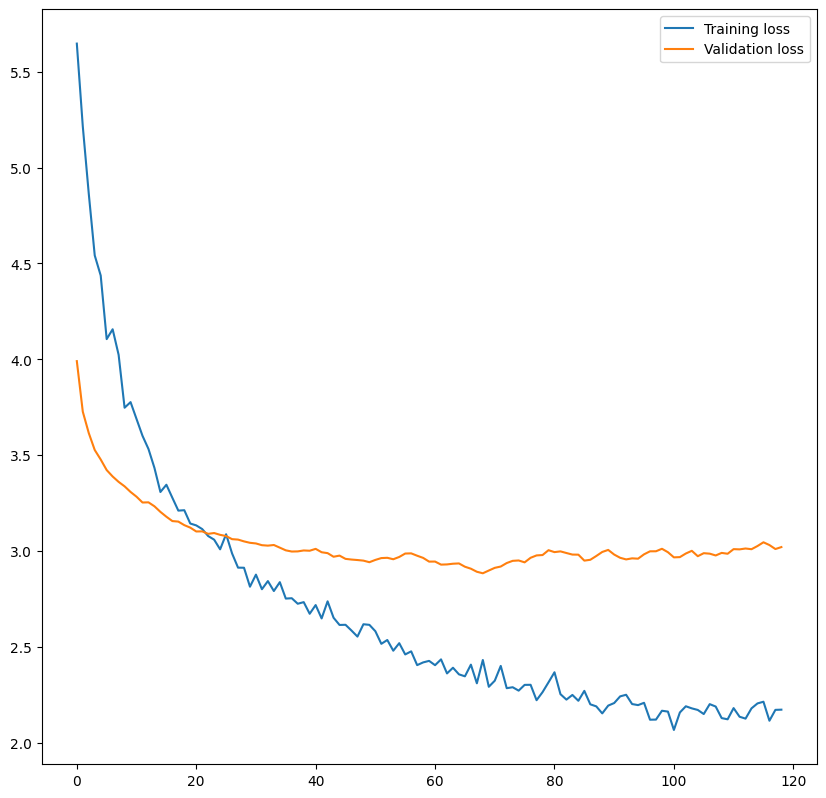

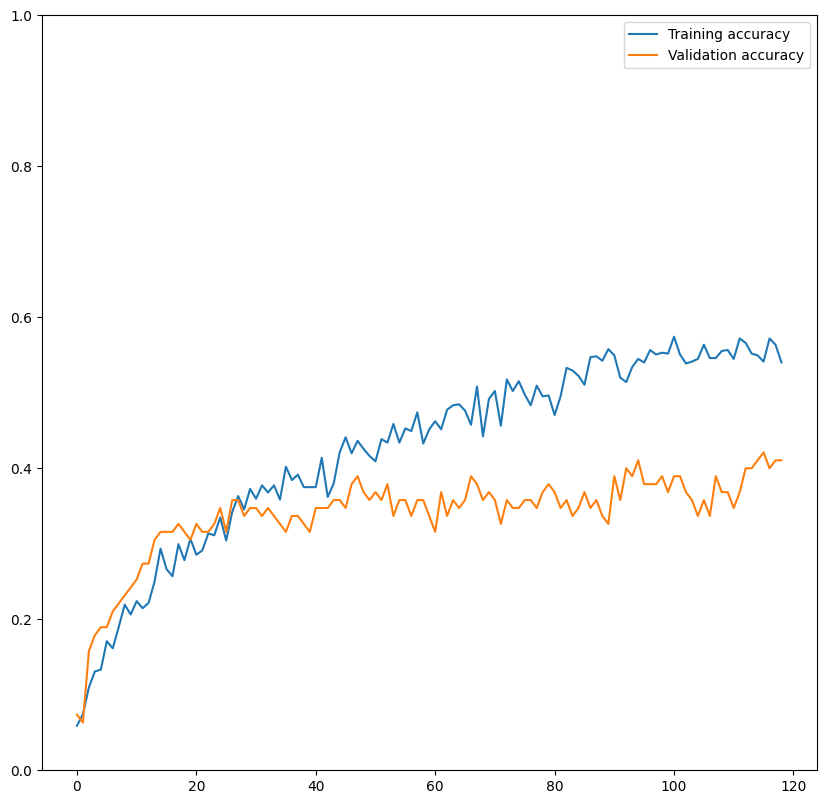

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Model's sccuracy is: 0.3305084745762712
The confusion matrix is: 
 [[ 3  0  0  1  0  0  2  0  1  1  1  1  2  0  1  1  0  4]
 [ 0  1  1  0  0  0  2  0  0  0  0  0  4  0  0  0  0  3]
 [ 0  0  1  0  0  0  0  0  0  0  0  1  0  0  0  1  2  4]
 [ 0  0  0  1  0  0  0  0  0  0  0  0 10  0  0  0  0  3]
 [ 0  0  0  1  4  0  0  0  0  1  0  0  2  0  0  0  0  1]
 [ 0  0  1  0  1  0  0  0  0  0  0  0  3  0  0  0  1  3]
 [ 0  1  0  2  0  0  7  0  0  0  0  0  5  0  0  0  0  0]
 [ 0  0  1  0  0  0  0  0  0  0  0  1  0  0  0  0  0  0]
 [ 0  1  0  0  0  1  0  0  3  0  0  1  2  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0 12  0  0  6  0  0  1  2  1]
 [ 0  0  1  0  0  0  0  0  1  0  3  0  3  0  0  0  0  1]
 [ 1  0  0  0  0  0  0  0  0  0  0  2  2  0  0  0  0  3]
 [ 0  1  0  0  0  0  2  0  1  0  1  0 18  0  0  2  0  2]
 [ 0  0  0  0  0  1  1  0  0  1  0  1  1  1  0  0  0  4]
 [ 0  0  0  1  0  0  0  1  0  1  0  0  3  0  1  0  0  8]
 [ 0  1  0  0  0  1  1  0  0  0  1  0  2

In [407]:
# Dense model
inputs = keras.layers.Input(shape=[1024])
x = keras.layers.BatchNormalization()(inputs)
x = keras.layers.Dropout(0.65)(x)
x = keras.layers.Dense(units=500, activation="relu", kernel_regularizer=l2(0.001))(x)
x = keras.layers.BatchNormalization()(x)
x = keras.layers.Dropout(0.65)(x)
x = keras.layers.Dense(units=200, activation="relu", kernel_regularizer=l2(0.001))(x)
x = keras.layers.BatchNormalization()(x)
x = keras.layers.Dropout(0.65)(x)
outputs = keras.layers.Dense(units=num_classes, activation="softmax")(x)

dense_model = keras.Model(inputs=inputs, outputs=outputs)
opt = Adam()
dense_model.compile(optimizer=opt, loss="categorical_crossentropy", metrics=["acc"])

# Training
diag = dense_model.fit(car_train1, y_train, batch_size=32, epochs=1000, validation_split=0.1, callbacks=[EarlyStopping(monitor='val_loss', patience=50, restore_best_weights=True)])
showevolution(diag, 'DenseNetFeatExt')

# Classification
y_preds = dense_model.predict(car_test1, verbose=True)

print("Model's sccuracy is: " + str(calcaccuracy(y_test, y_preds)))

y_test_conf = np.argmax(y_test, axis=1)
y_preds = np.argmax(y_preds, axis=1)
print("The confusion matrix is: \n", confusion_matrix(y_test_conf, y_preds))

Model 2: Xception Feature extractor

In [408]:
#Image data generators
train_generator, test_generator = generators(x_train)

# Consider the model before the last pooling
feat_extractor = Xception(include_top=False, weights='imagenet', pooling='avg' )

# Model compilation
opt = Adam()
feat_extractor.compile(optimizer=opt, loss="categorical_crossentropy", metrics=["acc"])

# It will return the data in an array of 2048 dimensions
feat_extractor = keras.Model(inputs=feat_extractor.inputs, outputs= feat_extractor.layers[-1].output)
feat_extractor.compile(optimizer=opt, loss="categorical_crossentropy", metrics=["acc"])

# Extract features
car_train2 = feat_extractor.predict(train_generator.flow(x_train, batch_size=1, shuffle=False),verbose=1, steps=len(x_train))
car_test2 = feat_extractor.predict(test_generator.flow(x_test, batch_size=1, shuffle=False),verbose=1, steps=len(x_test))

#feat_extractor.summary()

/Users/davidvillarmartos/opt/anaconda3/lib/python3.9/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
/Users/davidvillarmartos/opt/anaconda3/lib/python3.9/site-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_17096']
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


943/943 ━━━━━━━━━━━━━━━━━━━━ 63s 65ms/step
236/236 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step


Epoch 1/1000
27/27 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - acc: 0.0433 - loss: 5.9440 - val_acc: 0.0842 - val_loss: 3.9767
Epoch 2/1000
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - acc: 0.0561 - loss: 5.3480 - val_acc: 0.1789 - val_loss: 3.8739
Epoch 3/1000
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - acc: 0.1010 - loss: 4.9644 - val_acc: 0.1895 - val_loss: 3.8383
Epoch 4/1000
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - acc: 0.1101 - loss: 4.8973 - val_acc: 0.2000 - val_loss: 3.7819
Epoch 5/1000
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - acc: 0.1688 - loss: 4.4391 - val_acc: 0.1895 - val_loss: 3.7691
Epoch 6/1000
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - acc: 0.1573 - loss: 4.5482 - val_acc: 0.2211 - val_loss: 3.7561
Epoch 7/1000
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - acc: 0.1550 - loss: 4.3730 - val_acc: 0.2105 - val_loss: 3.7793
Epoch 8/1000
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - acc: 0.1954 - loss: 4.3236 - val_acc: 0.2316 - val_loss: 3.7460
Epoch 9/1000
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/

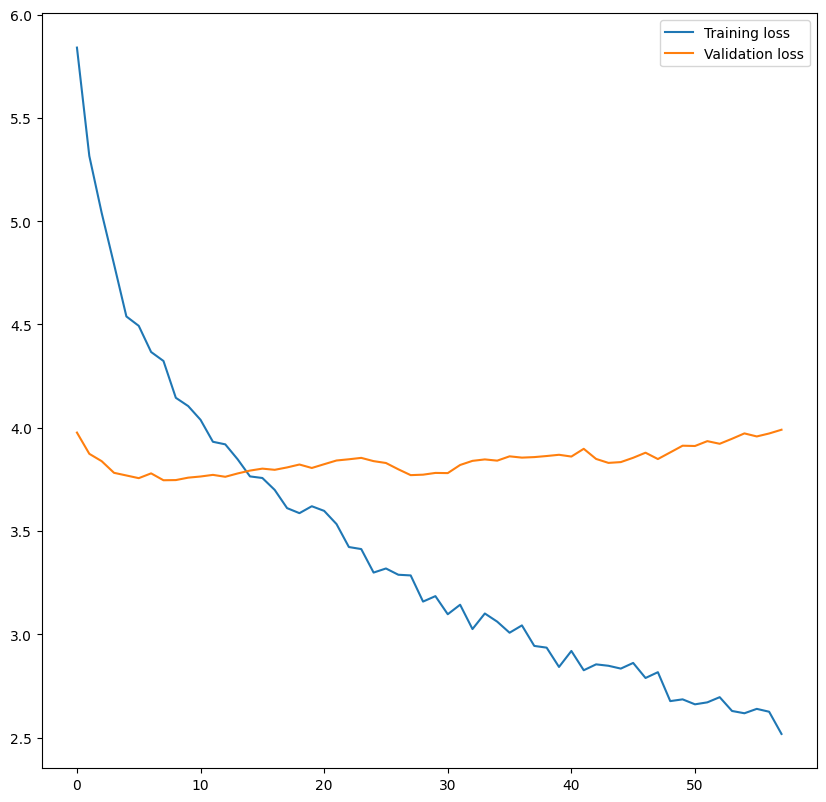

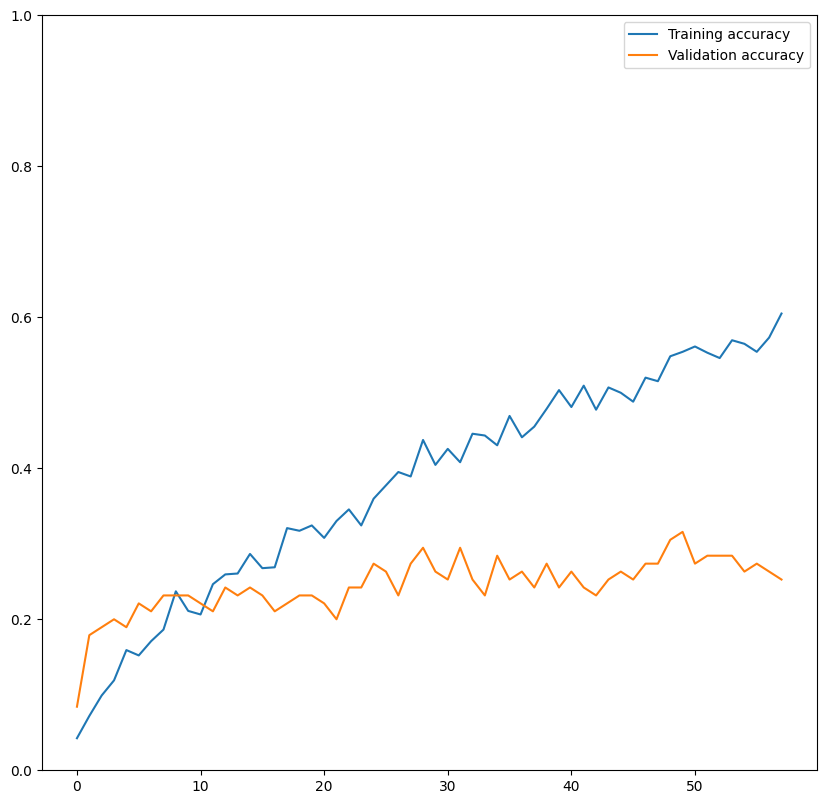

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Model's sccuracy is: 0.2245762711864407
The confusion matrix is: 
 [[ 6  0  0  1  0  0  0  0  0  3  0  0  4  0  0  0  0  4]
 [ 1  4  0  0  0  0  0  0  0  1  0  0  3  0  0  0  0  2]
 [ 2  0  0  0  0  0  0  0  0  0  0  0  4  1  0  0  0  2]
 [ 2  0  0  1  0  0  0  0  0  1  1  1  7  0  0  0  0  1]
 [ 0  0  0  0  2  0  0  0  0  1  0  2  1  0  2  0  0  1]
 [ 1  1  0  0  0  0  0  0  0  3  0  0  1  0  0  0  0  3]
 [ 0  1  0  4  0  0  0  0  0  6  0  0  2  0  1  0  0  1]
 [ 0  0  0  0  0  0  0  0  0  0  0  0  1  0  0  1  0  0]
 [ 2  1  0  1  0  0  0  0  0  0  0  0  2  0  0  2  0  0]
 [ 2  0  0  0  0  0  0  0  0 10  0  0  6  0  0  1  0  3]
 [ 1  0  0  1  0  0  0  0  0  1  0  0  5  0  0  0  0  1]
 [ 1  0  0  0  0  0  0  0  0  0  0  2  3  0  0  0  0  2]
 [ 4  1  0  1  0  0  0  0  0  3  0  1 11  0  0  0  0  6]
 [ 0  1  0  1  0  0  0  0  0  1  0  0  2  0  0  0  0  5]
 [ 0  0  0  1  1  0  0  0  0  2  0  2  5  0  0  0  0  4]
 [ 0  1  0  0  0  0  0  0  0  1  0  2  8

In [409]:
# Dense Model
inputs = keras.layers.Input(shape=[2048])
x = keras.layers.BatchNormalization()(inputs)
x = keras.layers.Dropout(0.65)(x)
x = keras.layers.Dense(units=500, activation="relu", kernel_regularizer=l2(0.001))(x)
x = keras.layers.BatchNormalization()(x)
x = keras.layers.Dropout(0.65)(x)
x = keras.layers.Dense(units=200, activation="relu", kernel_regularizer=l2(0.001))(x)
x = keras.layers.BatchNormalization()(x)
x = keras.layers.Dropout(0.65)(x)
outputs = keras.layers.Dense(units=num_classes, activation="softmax")(x)

dense_model = keras.Model(inputs=inputs, outputs=outputs)
opt = Adam()
dense_model.compile(optimizer=opt, loss="categorical_crossentropy", metrics=["acc"])

# Training
diag = dense_model.fit(car_train2, y_train, batch_size=32, epochs=1000, validation_split=0.1, callbacks=[EarlyStopping(monitor='val_loss', patience=50, restore_best_weights=True)])
showevolution(diag, 'XceptionFeatExt')

# Classification
y_preds = dense_model.predict(car_test2, verbose=True)

print("Model's sccuracy is: " + str(calcaccuracy(y_test, y_preds)))

y_test_conf = np.argmax(y_test, axis=1)
y_preds = np.argmax(y_preds, axis=1)
print("The confusion matrix is: \n", confusion_matrix(y_test_conf, y_preds))

Now i will define a fine tuning with densenet with only the last 20 layers being trainable

/Users/davidvillarmartos/opt/anaconda3/lib/python3.9/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/1000
27/27 ━━━━━━━━━━━━━━━━━━━━ 111s 3s/step - acc: 0.0805 - loss: 4.2464 - val_acc: 0.1596 - val_loss: 3.3855
Epoch 2/1000
27/27 ━━━━━━━━━━━━━━━━━━━━ 84s 3s/step - acc: 0.1207 - loss: 3.5098 - val_acc: 0.2447 - val_loss: 3.2311
Epoch 3/1000
27/27 ━━━━━━━━━━━━━━━━━━━━ 90s 3s/step - acc: 0.1376 - loss: 3.3111 - val_acc: 0.3511 - val_loss: 3.0381
Epoch 4/1000
27/27 ━━━━━━━━━━━━━━━━━━━━ 80s 3s/step - acc: 0.1885 - loss: 3.1474 - val_acc: 0.3617 - val_loss: 2.9386
Epoch 5/1000
27/27 ━━━━━━━━━━━━━━━━━━━━ 82s 3s/step - acc: 0.2421 - loss: 3.0345 - val_acc: 0.3723 - val_loss: 2.9348
Epoch 6/1000
27/27 ━━━━━━━━━━━━━━━━━━━━ 79s 3s/step - acc: 0.2199 - loss: 2.9810 - val_acc: 0.3617 - val_loss: 2.7538
Epoch 7/1000
27/27 ━━━━━━━━━━━━━━━━━━━━ 85s 3s/step - acc: 0.2902 - loss: 2.7975 - val_acc: 0.3404 - val_loss: 2.7363
Epoch 8/1000
27/27 ━━━━━━━━━━━━━━━━━━━━ 77s 3s/step - acc: 0.3004 - loss: 2.7371 - val_acc: 0.3617 - val_loss: 2.7185
Epoch 9/1000
27/27 ━━━━━━━━━━━━━━━━━━━━ 81s 3s/step - a

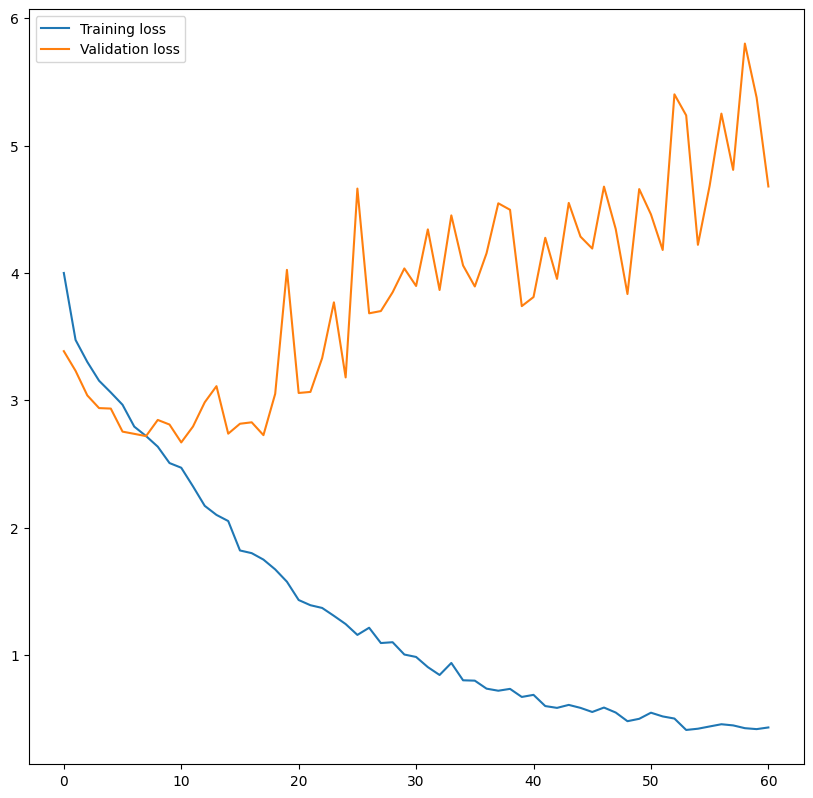

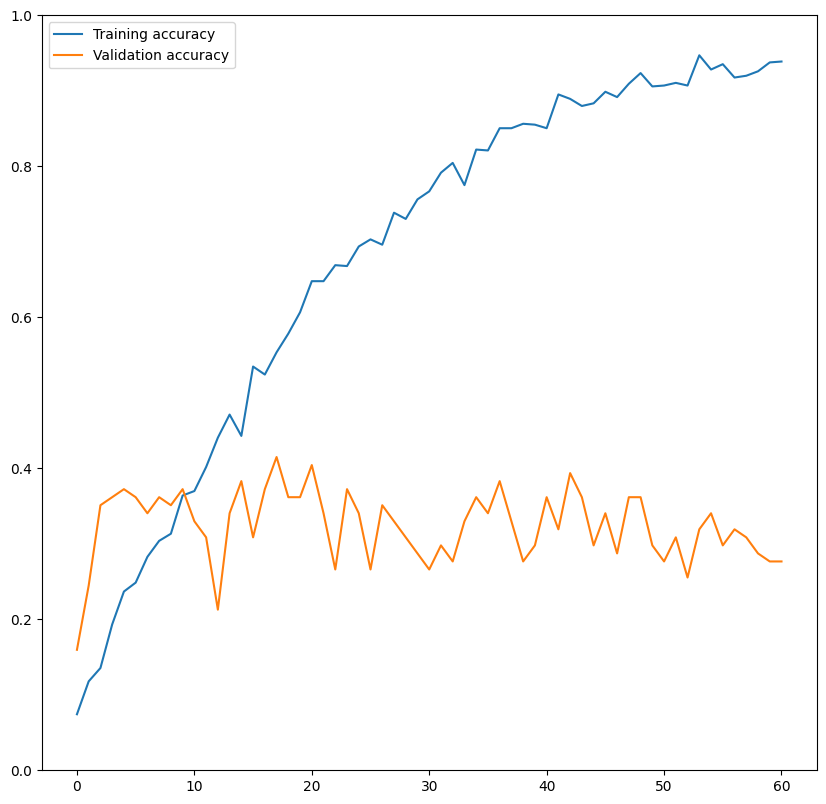

236/236 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step
Model's sccuracy is: 0.3093220338983051
The confusion matrix is: 
 [[ 8  0  0  1  0  0  3  0  0  2  0  0  0  0  0  0  3  1]
 [ 0  1  0  1  0  1  1  0  0  0  0  0  2  0  0  0  2  3]
 [ 0  0  0  2  0  0  0  0  0  0  0  0  1  0  0  0  3  3]
 [ 2  0  0  2  1  0  1  0  0  0  0  1  5  0  0  0  0  2]
 [ 0  0  0  1  3  0  1  0  0  1  0  0  1  0  1  0  0  1]
 [ 0  0  0  2  0  0  2  0  0  0  0  0  2  0  0  0  0  3]
 [ 1  0  0  0  0  0  9  0  0  0  0  0  4  0  0  0  1  0]
 [ 1  0  0  0  0  0  0  0  0  0  0  0  1  0  0  0  0  0]
 [ 1  0  0  1  0  0  0  0  0  1  0  0  2  0  0  0  2  1]
 [ 2  0  0  0  0  0  2  0  0 14  0  0  3  0  0  0  0  1]
 [ 2  0  0  0  0  0  2  0  0  1  0  0  1  0  0  0  2  1]
 [ 1  0  0  0  0  0  0  0  0  0  0  0  3  0  0  0  0  4]
 [ 0  0  0  0  0  0  5  0  0  2  0  1 14  0  0  0  4  1]
 [ 0  0  0  0  1  1  1  0  0  1  0  0  1  0  0  0  0  5]
 [ 0  0  0  1  0  0  0  0  0  4  0  0  3  0  0  0  4  3]
 [ 2  0  0  0  1  0  2  0  0  2  0 

In [412]:
#Fine Tunning
train_generator, test_generator = generators(x_train)

# Load the model before last pooling
denseNet = DenseNet121(include_top=False, weights='imagenet', pooling='avg', )

# By default all layers are not trainable
denseNet.trainable = False
for layer in denseNet.layers[-20:]:  # Free the last 20 layers so that they can be trained
    layer.trainable = True

# Dense model
x = keras.layers.Dense(units=500, activation="relu", kernel_regularizer=l2(0.001))(denseNet.output)
x = keras.layers.Dropout(0.5)(x)
x = keras.layers.Dense(units=200, activation="relu", kernel_regularizer=l2(0.001))(x)
x = keras.layers.Dropout(0.5)(x)
outputs = keras.layers.Dense(units=num_classes, activation="softmax")(x)

model = keras.Model(inputs=denseNet.input, outputs=outputs)
opt = Adam()
model.compile(optimizer=opt, loss="categorical_crossentropy", metrics=["acc"])

# Training
diag = model.fit(train_generator.flow(x_train, y_train, batch_size = 32, subset = 'training'),
                                  steps_per_epoch = math.ceil(len(x_train)*0.9/32),
                                  epochs = 1000,
                                  callbacks=[EarlyStopping(monitor='val_loss', patience=50, restore_best_weights=True)],
                                  validation_data = train_generator.flow(x_train, y_train, batch_size = 32, subset = 'validation'),
                                  validation_steps =math.ceil(len(x_train)*0.1/32))

showevolution(diag, 'DenseNetFT')
#model.summary()
# Classification
y_preds = model.predict(test_generator.flow(x_test, batch_size=1, shuffle=False),verbose=1, steps=len(x_test))

print("Model's sccuracy is: " + str(calcaccuracy(y_test, y_preds)))

y_test_conf = np.argmax(y_test, axis=1)
y_preds = np.argmax(y_preds, axis=1)
print("The confusion matrix is: \n", confusion_matrix(y_test_conf, y_preds))

### Histogram consideration

We will incorporate to the classification the histograms of colors (in HSV values) of each image. It makes sense that the color of the Pokémon (not shiny form) is correlated with its typing. Let us see the efect of this addition to the final predictions

Epoch 1/1000
27/27 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - acc: 0.0745 - loss: 5.7166 - val_acc: 0.0632 - val_loss: 3.7578
Epoch 2/1000
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - acc: 0.0694 - loss: 5.1254 - val_acc: 0.1263 - val_loss: 3.6150
Epoch 3/1000
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - acc: 0.1176 - loss: 4.7194 - val_acc: 0.1579 - val_loss: 3.4811
Epoch 4/1000
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - acc: 0.1276 - loss: 4.3923 - val_acc: 0.1895 - val_loss: 3.3871
Epoch 5/1000
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - acc: 0.1615 - loss: 4.2777 - val_acc: 0.2316 - val_loss: 3.3114
Epoch 6/1000
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - acc: 0.1786 - loss: 4.0596 - val_acc: 0.2947 - val_loss: 3.2569
Epoch 7/1000
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - acc: 0.1897 - loss: 3.8560 - val_acc: 0.2947 - val_loss: 3.2120
Epoch 8/1000
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - acc: 0.2173 - loss: 3.8093 - val_acc: 0.2526 - val_loss: 3.1812
Epoch 9/1000
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/

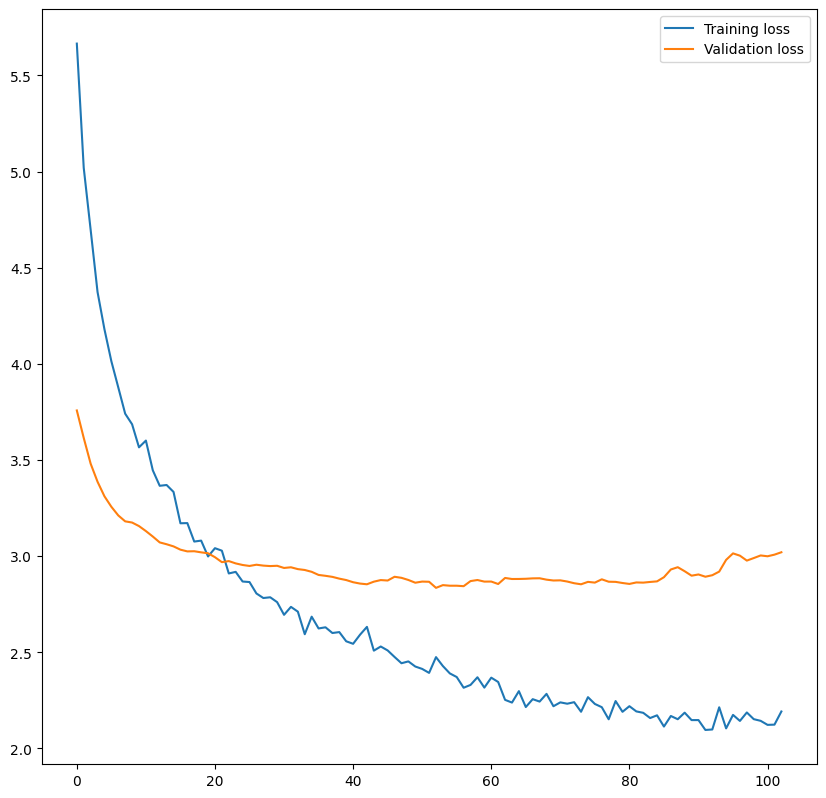

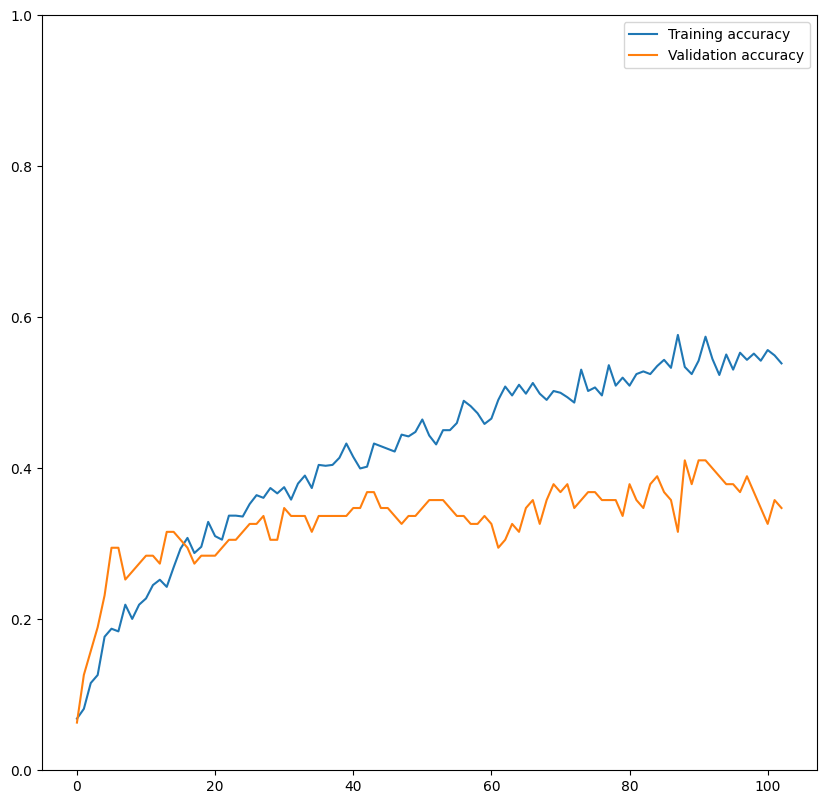

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Model's sccuracy is: 0.3050847457627119
The confusion matrix is: 
 [[ 3  1  0  0  0  0  2  0  1  2  1  0  3  0  1  2  0  2]
 [ 0  0  1  0  0  0  3  0  0  0  0  1  3  0  0  0  0  3]
 [ 0  0  1  0  0  1  0  0  2  0  0  0  0  0  0  0  1  4]
 [ 1  0  0  1  0  0  0  0  0  0  0  0  9  0  0  0  0  3]
 [ 0  1  0  1  4  0  0  0  0  0  0  1  2  0  0  0  0  0]
 [ 0  0  1  0  1  0  0  0  0  0  0  1  1  0  0  0  1  4]
 [ 0  1  0  0  0  0  8  1  0  0  0  0  4  0  0  0  0  1]
 [ 0  0  1  0  0  0  0  0  0  0  0  1  0  0  0  0  0  0]
 [ 0  1  0  0  0  1  0  0  2  0  0  1  2  0  0  1  0  0]
 [ 1  0  0  0  0  0  0  0  1 12  0  0  6  0  0  1  0  1]
 [ 0  2  2  0  0  0  0  0  0  1  1  0  1  0  0  1  0  1]
 [ 1  0  0  0  0  0  0  0  0  0  0  1  3  0  1  0  0  2]
 [ 0  2  0  0  0  0  1  0  1  0  1  0 16  0  2  1  0  3]
 [ 0  0  0  1  0  1  0  0  1  0  0  1  0  1  0  0  0  5]
 [ 0  0  0  1  0  0  0  1  0  1  0  0  4  0  1  0  1  6]
 [ 0  0  0  0  0  1  2  0  0  1  1  1  3

In [411]:
# Dense Model
inputs = keras.layers.Input(shape=[1024])
histogram_input = layers.Input(shape=(768,))

# Histogram incoroporation
x = layers.concatenate([inputs, histogram_input])
x = keras.layers.BatchNormalization()(x)
x = keras.layers.Dropout(0.65)(x)
x = keras.layers.Dense(units=500, activation="relu", kernel_regularizer=l2(0.001))(x)
x = keras.layers.BatchNormalization()(x)
x = keras.layers.Dropout(0.65)(x)
x = keras.layers.Dense(units=200, activation="relu", kernel_regularizer=l2(0.001))(x)
x = keras.layers.BatchNormalization()(x)
x = keras.layers.Dropout(0.65)(x)
outputs = keras.layers.Dense(units=num_classes, activation="softmax")(x)

dense_model = keras.Model(inputs=[inputs, histogram_input], outputs=outputs)
opt = Adam()
dense_model.compile(optimizer=opt, loss="categorical_crossentropy", metrics=["acc"])

# Training
diag = dense_model.fit([car_train1, hist_train], y_train, batch_size=32, epochs=1000, validation_split=0.1, callbacks=[EarlyStopping(monitor='val_loss', patience=50, restore_best_weights=True)])
showevolution(diag, 'DenseNetFeatExtHist')

# Classification
y_preds = dense_model.predict([car_test1, hist_test], verbose=True)

print("Model's sccuracy is: " + str(calcaccuracy(y_test, y_preds)))

y_test_conf = np.argmax(y_test, axis=1)
y_preds = np.argmax(y_preds, axis=1)
print("The confusion matrix is: \n", confusion_matrix(y_test_conf, y_preds))